In [3]:
#Initialisation: 
#import des librairies et des données
#déclaration de fonctions
import numpy as np
import seaborn as sns
import pandas as pd 
import matplotlib.pyplot as plt
from collections import Counter
from scipy.integrate import simps

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

path_data = "C:/Users/Anwender/Desktop/openclassroom/projet_2/data/EdStatsData.csv"
data = pd.read_csv(path_data,sep=',', header=0)
data.name = "data"

path_data = "C:/Users/Anwender/Desktop/openclassroom/projet_2/data/EdStatsCountry.csv"
data_country = pd.read_csv(path_data,sep=',', header=0)
data_country.name = "data_country"

path_data = "C:/Users/Anwender/Desktop/openclassroom/projet_2/data/EdStatsCountry-Series.csv"
data_country_s = pd.read_csv(path_data,sep=',', header=0)
data_country_s.name = "data_country_s"

path_data = "C:/Users/Anwender/Desktop/openclassroom/projet_2/data/EdStatsFootNote.csv"
data_footnote = pd.read_csv(path_data,sep=',', header=0)
data_footnote.name = "data_footnote"

path_data = "C:/Users/Anwender/Desktop/openclassroom/projet_2/data/EdStatsSeries.csv"
data_series = pd.read_csv(path_data,sep=',', header=0)
data_series.name = "data_series"

def country_to_region(x):
    if pd.isna(x['Region']):
        return x['Country Name']
    else:
        return x['Region']
    
def verif_dupl(d):
    k = (d.iloc[:,0].size)-(d.drop_duplicates().iloc[:,0].size)
    if k==0:
        remarque_duplicate = "Il ne semble pas y avoir de doublons dans "+d.name
    else:
        remarque_duplicate = "Il y a "+str(k)+" doublons dans "+d.name   
    print(remarque_duplicate)

def info_size(d):
    print("Le jeu de données "+d.name+" comporte " +str(d.index.size)+" lignes pour "+str(d.columns.size)+" colonnes")
    
def key_gestion(d):
#     indic_key = ["15-19", "24", "25", "28", "29", "teacher", "internet"]
#     indic_key = ["USD", "$", "dollars", "Dollars"]
    indic_key = ["15", "19", "diploma"]
    #indic_key = ["teacher"] #avec ces indic on peut étudier le coût des professeur et comparer le coût d'une de nos formations et être force d eproposition
    less_key = ["male", "female", "Male", "Female"]
    indic_list = []
    for indicator in d["Indicator Name"].unique():
        if any(word in str(indicator) for word in indic_key):
            if any(word in str(indicator) for word in less_key):
                pass
            else:
                print(indicator)
#                 print(d[d["Indicator Name"]==indicator]["Indicator Code"])
                print("\n")
    
def petit_resume_svp(d, region, indic, d2):
    l = ["Median","Var","Std","Skew","Kurtosis"]
    resumed  = "Dans la région "+str(region)+" l'indicateur "+str(indic)+" a pour valeur médiane "+str(round(d.loc[region, indic]["Median"],2))
    
    resumed += ".\nMais aussi un ecart-type de "+str(round(d.loc[region, indic]["Std"],2))
    
    resumed += ".\nSon skewness "+str(round(d.loc[region, indic]["Skew"],2))
    if d.loc[region, indic]["Skew"]>(0.1):
        resumed += " indique que la distribution est plutôt étalée à droite"
    elif d.loc[region, indic]["Skew"]<(-0.1):
        resumed += " indique que distribution est plutôt étalée à gauche"
    else:
        resumed += " indique que la distribution est plutôt symétrique"
        
    resumed += ".\nEnfin son kurtosis "+str(round(d.loc[region, indic]["Kurtosis"],2))
    if d.loc[region, indic]["Kurtosis"]>(0.2):
        resumed += " indique que sa distribution est moins aplatie que la distribution normale : les observations sont plus concentrées."
    elif d.loc[region, indic]["Kurtosis"]<(-0.2):
        resumed += " indique que les observations sont moins concentrées : la distribution est plus aplatie."
    else:
        resumed += " indique que la distribution a le même aplatissement que la distribution normale."
    print(resumed)
    
    print("\nEn voici une petite boîte à moustache:\n")
    d_boxplot = df_1[df_1["Region"]==region]
    d_boxplot = d_boxplot[d_boxplot["Indicator Code"]==indic]
    d_boxplot = d_boxplot.iloc[:,4:68].dropna(axis=1).mean(axis=0)
    plt.boxplot(d_boxplot)
    plt.title(str(indic)+" in "+str(region))
    plt.show()   

In [4]:
# df_NA = dico_region["North America"][dico_region["North America"]["Country Name"]=="Canada"]
key_gestion(df_1)
#PRJ.POP.1519.2.MF(Lower Secondary), PRJ.POP.1519.4.MF (post secondary),PRJ.POP.1519.3.MF (upper secondary)
#PRJ.POP.2024.2.MF (lower secondary), PRJ.POP.2024.4.MF (post secondary), PRJ.POP.2024.3.MF (upper secondary)

NameError: name 'df_1' is not defined

In [ ]:
#vérification du bon nombre d'indicateur après merge
df_2 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
df_3=df_2.join(data.iloc[:,2:])
print(df_3["Country Name"].size/242)

In [5]:
#accoler country et région et s'arrêter à 2020
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
print("4")
# df_1=df_1.iloc[:,0:54]

1
2
3
4


In [ ]:
#création de variables utiles pour l'analyse
d_regions = df_1["Region"].unique()
print(d_regions)
u_indic = data["Indicator Name"].unique()
print(u_indic.size)
u_indic_code = data["Indicator Code"].unique()
print(u_indic_code.size)
u_country = data["Country Name"].unique()
print(u_country)


In [ ]:
#plot de données manquantes par années
k = data.iloc[:, 4:].isna().sum()
fig = plt.figure(figsize=(25,15))
fig.add_subplot(3,2,1)
plt.style.use(plt.style.available[1])
plt.xticks(rotation=90)
plt.plot(k)
#plt.text(s=plt.style.available[i], x=10, y=10, color='red')

In [ ]:
#Useless
k = data.iloc[:, 4:].isna().sum(axis=1)
fig = plt.figure(figsize=(25,15))
fig.add_subplot(3,2,1)
plt.style.use(plt.style.available[1])
plt.xticks(rotation=90)
plt.plot(k)

In [2]:
#étude des données présentes par région par indicateur par période de 5ans
def missing_value_per_period(df, start, end):
    #on définit la surface d'étude: année de début et de fin et on compte les nan sur ces années
    k = df.iloc[:, start:end].notna().sum(axis=1)
    #on fait la moyenne des values existantes sur la période
    l = pd.DataFrame(100*k/(df.iloc[0,start:end].size), columns=[str(2020+start)+str("-")+str(2020+end)])
    #df_mean_na = df_1.iloc[:,0:5].join(l)
    #on join les indicateurs du dataset aux moyennes de donnée présentes puis on jette les variables inutiles au calcul
    df_mean_na = df.iloc[:,0:5].join(l)
    df_mean_na = df_mean_na.drop(["Country Code", "Country Name", "Indicator Code"], axis=1)
    #on regroupe le tout par région et par indicateur
    k = df_mean_na.groupby(["Region", "Indicator Name"])[str(2020+start)+str("-")+str(2020+end)].mean()
    del df_mean_na
    return(k)

#pour chaque période nous allons étudier les données présentes
periods = [-30, -25, -20, -15, -10, -5]
l = []
for i in range(len(periods)):
    if i!=(len(periods)-1):
        l.append(missing_value_per_period(df_1, periods[i], periods[i+1]))
    else:
        print(periods[i])
        l.append(missing_value_per_period(df_1, periods[i], -1))

to_graph = pd.DataFrame(l).transpose()
fig = plt.figure(figsize=(100,100))
#on enlève les lignes remplies de 0, donc où il n'y a pas de valeurs
test_nn = to_graph[to_graph.iloc[:,:].sum(axis=1)>0]
# k = sns.heatmap(test_nn)
k = sns.heatmap(test_nn.loc[('Arab World'),:])

# k= sns.barplot(test_nn.loc[('Arab World'),('1990-1995')])
# ax = fig.add_axes([0,0,1,1])
# ax.bar(test_nn.loc[('Arab World', "Indicator Name"),:],test_nn.loc[('Arab World'),:])
# plt.show()
k

NameError: name 'df_1' is not defined

In [9]:
test_nn.iloc[0:5,:]
# l = test_nn["Region"].unique()
# l

# test_nn.loc[('Arab World'),:].loc["Adjusted net enrolment rate, primary, both sexes (%)"]

# k = df_1.iloc[:, -20:].isna().sum(axis=1)
# print(k.iloc[2:6,])
# l = pd.DataFrame(100*k/(df_1.iloc[0,-20:].size), columns=["try"])
# l.iloc[2:6,]
# r = data["Country Name"].value_counts()
# r

# k = df_1.iloc[0,5:].isna().sum(axi)
# k

1990-1995  \
Region     Indicator Name                                                  
Arab World Adjusted net enrolment rate, primary, both sexe...      100.0   
           Adjusted net enrolment rate, primary, female (%)        100.0   
           Adjusted net enrolment rate, primary, gender pa...      100.0   
           Adjusted net enrolment rate, primary, male (%)          100.0   
           Adjusted net intake rate to Grade 1 of primary ...      100.0   

                                                               1995-2000  \
Region     Indicator Name                                                  
Arab World Adjusted net enrolment rate, primary, both sexe...      100.0   
           Adjusted net enrolment rate, primary, female (%)        100.0   
           Adjusted net enrolment rate, primary, gender pa...      100.0   
           Adjusted net enrolment rate, primary, male (%)          100.0   
           Adjusted net intake rate to Grade 1 of primary ...      100.0   

                                                               2000-2005  \
Region     Indicator Name                                                  
Arab World Adjusted net enrolment rate, primary, both sexe...      100.0   
           Adjusted net enrolment rate, primary, female (%)        100.0   
           Adjusted net enrolment rate, primary, gender pa...      100.0   
           Adjusted net enrolment rate, primary, male (%)          100.0   
           Adjusted net intake rate to Grade 1 of primary ...      100.0   

                                                               2005-2010  \
Region     Indicator Name                                                  
Arab World Adjusted net enrolment rate, primary, both sexe...      100.0   
           Adjusted net enrolment rate, primary, female (%)        100.0   
           Adjusted net enrolment rate, primary, gender pa...      100.0   
           Adjusted net enrolment rate, primary, male (%)          100.0   
           Adjusted net intake rate to Grade 1 of primary ...      100.0   

                                                               2010-2015  \
Region     Indicator Name                                                  
Arab World Adjusted net enrolment rate, primary, both sexe...      100.0   
           Adjusted net enrolment rate, primary, female (%)        100.0   
           Adjusted net enrolment rate, primary, gender pa...      100.0   
           Adjusted net enrolment rate, primary, male (%)          100.0   
           Adjusted net intake rate to Grade 1 of primary ...      100.0   

                                                               2015-2019  
Region     Indicator Name                                                 
Arab World Adjusted net enrolment rate, primary, both sexe...       25.0  
           Adjusted net enrolment rate, primary, female (%)         25.0  
           Adjusted net enrolment rate, primary, gender pa...       25.0  
           Adjusted net enrolment rate, primary, male (%)           25.0  
           Adjusted net intake rate to Grade 1 of primary ...       25.0

In [ ]:
#étudier ces pourcentages
#étudier quels indicateur pour chaque région
#données intéressantes 15-24ans (lycée univ), on peut s'intéresser s'il y a un manque d'enseignant ou un taux de drop out particulier pour les remplacer, quel pourcentage de population va au secondaire
#quel est la politique du pays sur l'éducation?

###########Première observations###########
le fichier EdStatsData:
est un fichier de 886930 rows × 70 columns    #(data.iloc[:,0].size x data.iloc[0,].size)
pour 242 pays                                 #(data["Indicator Name"].unique()) 
et 3665 indicateurs                           #(data["Country Name"].unique())
242*3665=886930
On observe un pic de donnée tous les 5ans.
dans ces données un des indicateurs récurrents pour chaque pays:
['Adjusted net enrolment rate, lower secondary, both sexes (%)'
 'Adjusted net enrolment rate, lower secondary, female (%)'
 'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)'
 ... 'Youth literacy rate, population 15-24 years, female (%)'
 'Youth literacy rate, population 15-24 years, gender parity index (GPI)'
 'Youth literacy rate, population 15-24 years, male (%)']




In [ ]:
r = data[data["Country Name"]=="Arab World"].isna().sum(axis=1)
fig = plt.figure(figsize=(25,15))
#for i in range(6):
    # On peut ajouter des sous graphes ainsi
fig.add_subplot(3,2,i+1)
plt.style.use(plt.style.available[1])
plt.xticks(rotation=90)
plt.plot(r)

In [ ]:
r = data[data["Country Name"]=="Arab World"].notna().sum(axis=0)
r[r>0]
fig = plt.figure(figsize=(25,15))
#for i in range(6):
    # On peut ajouter des sous graphes ainsi
fig.add_subplot(3,2,i+1)
plt.style.use(plt.style.available[1])
plt.xticks(rotation=90)
plt.plot(r)

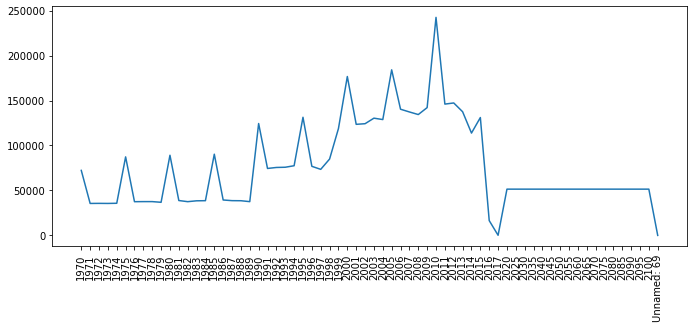

In [4]:
k = data.iloc[:, 4:].notna().sum()
fig = plt.figure(figsize=(25,15))
#for i in range(6):
    # On peut ajouter des sous graphes ainsi
fig.add_subplot(3,2,1)
plt.style.use(plt.style.available[1])
plt.xticks(rotation=90)
plt.plot(k)

In [ ]:
#test = data[0:45,].notna().pivot(index=["Country Name"], columns=["Indicator Code"],values=data.sum())
#etudions les pays
# pays par currency
l = data_country.groupby(["Currency Unit"])["Short Name"].unique()
l

In [105]:
#Analyse des données disponibles et remarques
#data.iloc[0:5,]           #country name, country code, indicator name, une période à étudier je pense 1990-2020 puis 2020-2100
#data_country   #à première vue je garderais le country code, le short name, la currency, la region (éventuellement income group)
#data_country_s #à première vue je n'utiliserais pas ce jeu de données, trop d'informations non-numériques et non-centrées vers la description du pays mais la description de son étude plutôt
#data_footnote  #l'année de l'étude peut être utile
#data_series["Long definition"].values   # peut être utile pour le sujet et la définition de l'indicateur (éventuellement la période étudiée)
#[data_series.loc[:,"Related indicators"].notna()]
indic_key = ["15-19", "24", "teacher", "internet"]
indic_key = ["Teacher"]
#indic_key = ["teacher"] #avec ces indic on peut étudier le coût des professeur et comparer le coût d'une de nos formations et être force d eproposition
less_key = ["male", "female", "Male", "Female"]
indic_list = []
for indicator in data_series["Indicator Name"].values:
    if any(word in str(indicator) for word in indic_key):
        if any(word in str(indicator) for word in less_key):
            pass
        else:
            indic_list.append(indicator)

for i in indic_list:
    print(i)
    print("\n")
#values to keep:
# Percentage of population age 15-19 with no education
# Percentage of population age 20-24 with no education
# Population in thousands, 15-19, total is the total population of 15-19 year olds in thousands estimated by Barro-Lee.
# Population in thousands, 20-24, total is the total population of 20-24 year olds in thousands estimated by Barro-Lee.
# Percentage of population age 15-19 with primary schooling. Completed Primary
# Percentage of population age 20-24 with primary schooling. Completed Primary
# Percentage of population age 15-19 with secondary schooling. Completed Secondary
# Percentage of population age 20-24 with secondary schooling. Completed Secondary
# Percentage of population age 15-19 with tertiary schooling. Completed Tertiary
# Percentage of population age 20-24 with tertiary schooling. Completed Tertiary

# Average years of schooling by age group. Age 15-19. Quintile 5 is the number of years of formal schooling received, on average, by the quintile 5 population of the given age group. Each poverty quintile represents one fifth of students with quintile 1 being the poorest 20 percent of students and quintile 5 being the richest 20 percent of students.
#variable intéressante si on arrive à prouver que l'éducation coute chère dans ce pays et que l'on peut fournir une éducation moins chère




SABER: (Engaging the Private Sector, Government funded) Policy Goal 5 Lever 1: Teacher standards


SABER: (Engaging the Private Sector, Government funded) Policy Goal 5 Lever 3: Teacher salaries


SABER: (Engaging the Private Sector, Government funded) Policy Goal 5 Lever 4: Teacher dismissal


SABER: (Engaging the Private Sector) Policy Goal 1 Lever 1: Teacher standards


SABER: (Engaging the Private Sector) Policy Goal 1 Lever 2: Teacher appointment and deployment


SABER: (Engaging the Private Sector) Policy Goal 1 Lever 3: Teacher salaries


SABER: (Engaging the Private Sector) Policy Goal 1 Lever 4: Teacher dismissal


SABER: (Teachers) Policy Goal 1: Setting clear expectations for teachers


SABER: (Teachers) Policy Goal 1 Lever 1: Are there clear expectations for teachers?


SABER: (Teachers) Policy Goal 1 Lever 2: Is there useful guidance on the use of teachers' working time?


SABER: (Teachers) Policy Goal 2: Attracting the best into teaching


SABER: (Teachers) Policy Goal 2 

In [104]:
less_key = ["male", "female", "Male", "Female"]
indic_list = []
for i in data_series["Indicator Name"].values:
    if any(word in str(i) for word in less_key):
        pass
    else:
        print(i)
#Proportion of out-of-school, Gini coefficient, attendance rate (en correlation avec quintile), SABER
#expliquer, je ne peux pas faire toutes les idées que j'ai mais voilà quelques exemples de comment je ferais pour les études que je voudrais faire
#montrer un exemple sur une région

Barro-Lee: Percentage of population age 15-19 with no education
Barro-Lee: Percentage of population age 15+ with no education
Barro-Lee: Percentage of population age 20-24 with no education
Barro-Lee: Percentage of population age 25-29 with no education
Barro-Lee: Percentage of population age 25+ with no education
Barro-Lee: Percentage of population age 30-34 with no education
Barro-Lee: Percentage of population age 35-39 with no education
Barro-Lee: Percentage of population age 40-44 with no education
Barro-Lee: Percentage of population age 45-49 with no education
Barro-Lee: Percentage of population age 50-54 with no education
Barro-Lee: Percentage of population age 55-59 with no education
Barro-Lee: Percentage of population age 60-64 with no education
Barro-Lee: Percentage of population age 65-69 with no education
Barro-Lee: Percentage of population age 70-74 with no education
Barro-Lee: Percentage of population age 75+ with no education
Barro-Lee: Population in thousands, age 15-19,

In [91]:
# print(data_series[data_series["Indicator Name"]=="Projection: Population age 20-24 in thousands by highest level of educational attainment. Incomplete Primary. Total"]["Long definition"].values)
l = ["Projection: Percentage of the population age 15-19 by highest level of educational attainment. Primary. Total",
"Projection: Percentage of the population age 15-19 by highest level of educational attainment. Lower Secondary. Total",
"Projection: Percentage of the population age 15-19 by highest level of educational attainment. Upper Secondary. Total",
"Projection: Percentage of the population age 15-19 by highest level of educational attainment. Post Secondary. Total",
"Projection: Percentage of the population age 15-19 by highest level of educational attainment. No Education. Total",
"Projection: Percentage of the population age 15-19 by highest level of educational attainment. Incomplete Primary. Total",
"Projection: Percentage of the population age 20-24 by highest level of educational attainment. Primary. Total",
"Projection: Percentage of the population age 20-24 by highest level of educational attainment. Lower Secondary. Total",
"Projection: Percentage of the population age 20-24 by highest level of educational attainment. Upper Secondary. Total",
"Projection: Percentage of the population age 20-24 by highest level of educational attainment. Post Secondary. Total",
"Projection: Percentage of the population age 20-24 by highest level of educational attainment. No Education. Total",
"Projection: Percentage of the population age 20-24 by highest level of educational attainment. Incomplete Primary. Total",
"Projection: Mean years of schooling. Age 15-19. Total",
"Projection: Mean years of schooling. Age 20-24. Total",
"Projection: Population age 15-19 in thousands by highest level of educational attainment. Primary. Total",
"Projection: Population age 15-19 in thousands by highest level of educational attainment. Lower Secondary. Total",
"Projection: Population age 15-19 in thousands by highest level of educational attainment. Upper Secondary. Total",
"Projection: Population age 15-19 in thousands by highest level of educational attainment. Post Secondary. Total",
"Projection: Population age 15-19 in thousands by highest level of educational attainment. No Education. Total",
"Projection: Population age 15-19 in thousands by highest level of educational attainment. Incomplete Primary. Total",
"Projection: Population age 20-24 in thousands by highest level of educational attainment. Primary. Total",
"Projection: Population age 20-24 in thousands by highest level of educational attainment. Lower Secondary. Total",
"Projection: Population age 20-24 in thousands by highest level of educational attainment. Upper Secondary. Total",
"Projection: Population age 20-24 in thousands by highest level of educational attainment. Post Secondary. Total",
"Projection: Population age 20-24 in thousands by highest level of educational attainment. No Education. Total",
"Projection: Population age 20-24 in thousands by highest level of educational attainment. Incomplete Primary. Total"]
k = df_1[df_1["Indicator Name"].isin(l)]
k[k.iloc[:,5:].notna().sum(axis=1)>0]

#Remarque les valeurs project sont vides

,Country Name,Country Code,Region,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100


In [3]:
#On cherche les predictions sur le jeu de données
print("1")
df_predict = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_predict=df_predict.join(data.iloc[:,2:])
print("3")
df_predict["Region"] = df_predict.apply(lambda x : country_to_region(x),axis=1)
print("4")
df_predict = df_predict.drop(columns=df_predict.columns[-1])
df_predict = df_predict.drop(columns=df_predict.columns[5:-17])
temp = df_predict.iloc[:, -17:].notna().sum(axis=1)
df_predict = df_predict.loc[temp[temp>0].index.values]
# pred_country = d_predict_2["Country Name"].unique()
# pred_indic = d_predict_2["Indicator Name"].unique()
# pred_country  #à modifier, intégrer le data set avec les régions au départ pour étudier par région
#pred_indic
df_predict.iloc[0:5,]
# d_predict_2[d_predict_2["Country Name"]=="Comoros"].index.size
# d_predict_2.notna().groupby("Country Name").sum()

# df_predict.index.difference()

# df_1=df_1.iloc[:,-18:]

1
2
3
4


,Country Name,Country Code,Region,Indicator Name,Indicator Code,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
91309,World,WLD,World,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.0T19.FE,2.0,2.10,2.20,2.30,2.30,2.30,2.40,2.50,2.50,2.50,2.60,2.60,2.60,2.7,2.70,2.70,2.70
91310,World,WLD,World,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.0T19.MA,2.0,2.10,2.20,2.20,2.30,2.30,2.40,2.40,2.50,2.50,2.60,2.60,2.60,2.7,2.70,2.70,2.70
91311,World,WLD,World,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.0T19.MF,2.0,2.10,2.20,2.30,2.30,2.30,2.40,2.40,2.50,2.50,2.60,2.60,2.60,2.7,2.70,2.70,2.70
91312,World,WLD,World,Wittgenstein Projection: Mean years of schooli...,PRJ.MYS.15UP.FE,8.3,8.70,9.00,9.30,9.70,10.00,10.30,10.60,10.80,11.10,11.40,11.60,11.90,12.1,12.30,12.50,12.70
91313,World,WLD,World,Wittgenstein Projection: Mean Years of Schooli...,PRJ.MYS.15UP.GPI,0.7,0.61,0.53,0.45,0.38,0.33,0.28,0.24,0.21,0.17,0.15,0.12,0.11,0.1,0.09,0.08,0.08


In [ ]:
#read indicators by region
#find good indicators of those regions and repertory them
#find axis of analysis == select the indicators
#study those indicators values: variance, co variance elasticity
#plot the fuck out of it
#write some remarks

In [15]:
#peut-on trouver des indicateurs qui ont des prédictions et qui s'appliquent à notre étude par région?
dico_region = {}
for region in df_predict["Region"].unique():
    dico_region[region] = test_nn.loc[region]
#     df_predict["Region"==region]

# d["Middle East & North Africa"] = d["Middle East & North Africa"].loc[df_predict[df_predict["Region"]=='Middle East & North Africa']["Indicator Name"].values]
# d["Middle East & North Africa"]

In [ ]:
#test_nn.loc["Middle East & North Africa"].loc["Wittgenstein Projection: Mean years of schooling. Age 0-19. Female"]
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
print("4")
df_1.iloc[0:5,:]
# k = df_1[df_1["Region"]=="Middle East & North Africa"]
# k[k["Indicator Name"]=="Wittgenstein Projection: Mean years of schooling. Age 0-19. Female"]

In [32]:
#1 Valider la qualité de ce jeu de données (comporte-t-il beaucoup de données manquantes, dupliquées ?)
#2 Décrire les informations contenues dans le jeu de données (nombre de colonnes ? nombre de lignes ?)
l = [data, data_country, data_country_s, data_footnote, data_series]
for i in l:
    print("")
    verif_dupl(i)
    info_size(i)
    print("\n")


Il ne semble pas y avoir de doublons dans data
Le jeu de données data comporte 886930 lignes pour 70 colonnes



Il ne semble pas y avoir de doublons dans data_country
Le jeu de données data_country comporte 241 lignes pour 32 colonnes



Il ne semble pas y avoir de doublons dans data_country_s
Le jeu de données data_country_s comporte 613 lignes pour 4 colonnes



Il ne semble pas y avoir de doublons dans data_footnote
Le jeu de données data_footnote comporte 643638 lignes pour 5 colonnes



Il ne semble pas y avoir de doublons dans data_series
Le jeu de données data_series comporte 3665 lignes pour 21 colonnes




1
2
3
-2
Dans data il y a 53455179 données manquantes sur 58537380 au total, soit près de 91.32% de la donnée


Dans Arab World il y a 97.43% de données manquante


Dans British Virgin Islands il y a 99.6% de données manquante


Dans East Asia & Pacific il y a 93.54% de données manquante


Dans East Asia & Pacific (excluding high income) il y a 97.78% de données manquante


Dans Euro area il y a 97.46% de données manquante


Dans Europe & Central Asia il y a 91.72% de données manquante


Dans Europe & Central Asia (excluding high income) il y a 97.94% de données manquante


Dans European Union il y a 97.55% de données manquante


Dans Gibraltar il y a 99.57% de données manquante


Dans Heavily indebted poor countries (HIPC) il y a 97.42% de données manquante


Dans High income il y a 97.44% de données manquante


Dans Latin America & Caribbean il y a 92.58% de données manquante


Dans Latin America & Caribbean (excluding high income) il y a 97.36% de données manquante


Dans Least deve

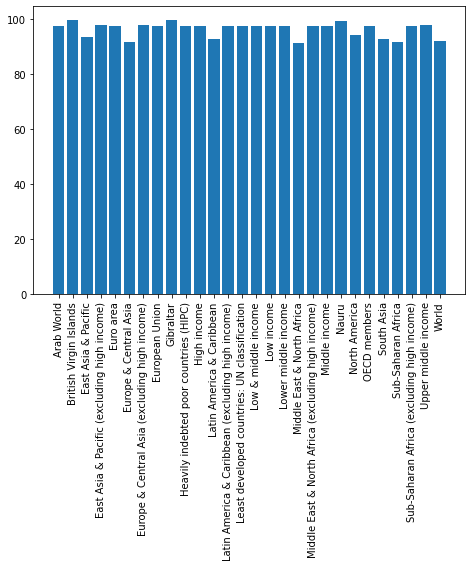

In [31]:
#1 Valider la qualité de ce jeu de données (comporte-t-il beaucoup de données manquantes, dupliquées ?)
def missing_discrete(d):
    k = d.iloc[:, 4:].isna().sum()
    print("Dans "+ d.name+" il y a " + str(k.values.sum())+ " données manquantes sur "+ str(d.iloc[:, 4:].size) + " au total, soit près de "+str(round(100*k.values.sum()/d.iloc[:, 4:].size,2)) +"% de la donnée")

def missing_percentage(d, name):
    print("Dans "+ name+" il y a " + str(round(100-d.mean(axis=1).values.mean(),2))+"% de données manquante")
    return(round(100-d.mean(axis=1).values.mean(),2))

def missing_value_per_period(df, start, end):
    #on définit la surface d'étude: année de début et de fin et on compte les nan sur ces années
    k = df.iloc[:, start:end].notna().sum(axis=1)
    #on fait la moyenne des values existantes sur la période
#     l = pd.DataFrame(100*k/(df.iloc[0,start:end].size), columns=[str(2020+start)+str("-")+str(2020+end)])
    l = pd.DataFrame(100*k/(df.iloc[0,start:end].size), columns=[str(df.columns.values[start])+str("-")+str(df.columns.values[end])])
    #on join les indicateurs du dataset aux moyennes de donnée présentes puis on jette les variables inutiles au calcul
    df_mean_na = df.iloc[:,0:5].join(l)
    df_mean_na = df_mean_na.drop(["Country Code", "Country Name", "Indicator Code"], axis=1)
    #on regroupe le tout par région et par indicateur
    k = df_mean_na.groupby(["Region", "Indicator Name"])[str(df.columns.values[start])+str("-")+str(df.columns.values[end])].mean()
    del df_mean_na
    return(k)    

print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
periods = [*range(-65, -16, 5)]+[*range(-16, -1, 1)]
l = []
for i in range(len(periods)):
    if i!=(len(periods)-1):
        l.append(missing_value_per_period(df_1, periods[i], periods[i+1]))
    else:
        print(periods[i])
        l.append(missing_value_per_period(df_1, periods[i], -1))

to_graph = pd.DataFrame(l).transpose()
#to_graph = to_graph[to_graph.iloc[:,:].sum(axis=1)>0] #à commenter décommenter pour avoir ou non les lignes sans donnée
dico_region = {}
for region in to_graph.index.get_level_values(0).unique():
    dico_region[region] = to_graph.loc[region]

new_l=[]
missing_discrete(data)
print("\n")
for i in dico_region.keys():
    dico_region[i].name = i
    new_l.append(missing_percentage(dico_region[i].iloc[:,:], i))
    print("\n")    

    
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(dico_region.keys(),new_l)
plt.xticks(rotation=90)
plt.show()


# print(dico_region.keys())
# dico_region["World"].iloc[0:3,:]

1
2
3
-2
Dans data il y a 53455179 données manquantes sur 58537380 au total, soit près de 91.32% de la donnée




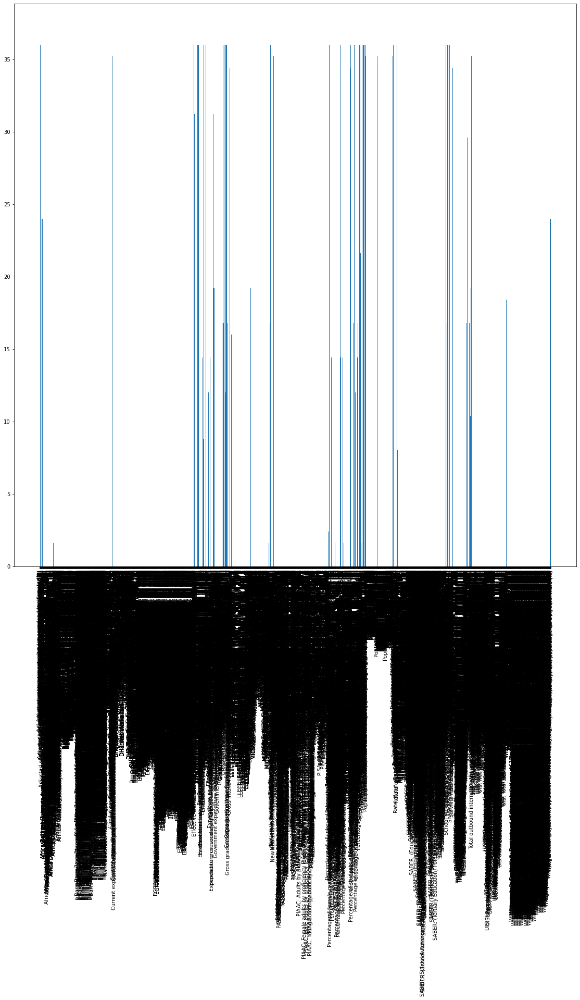

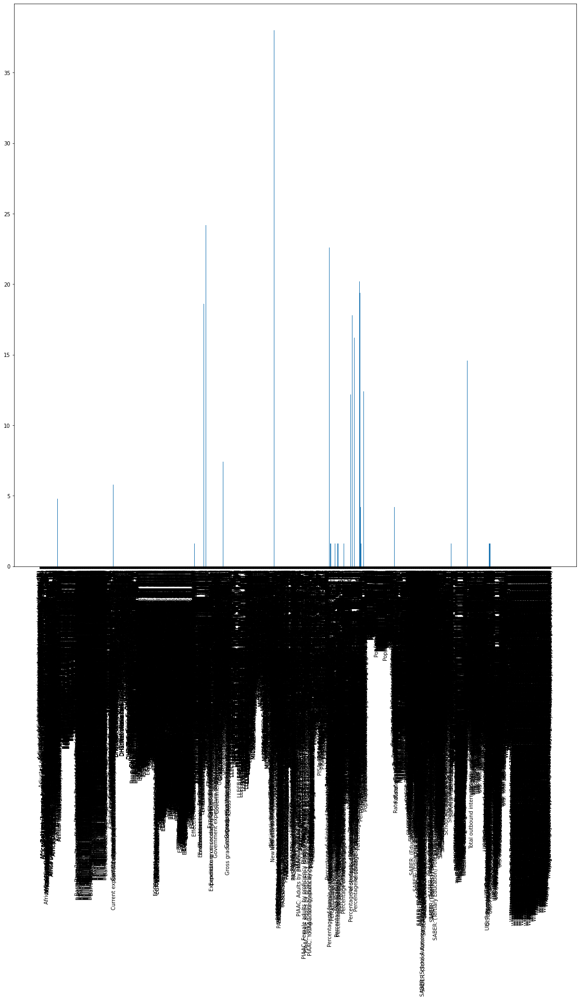

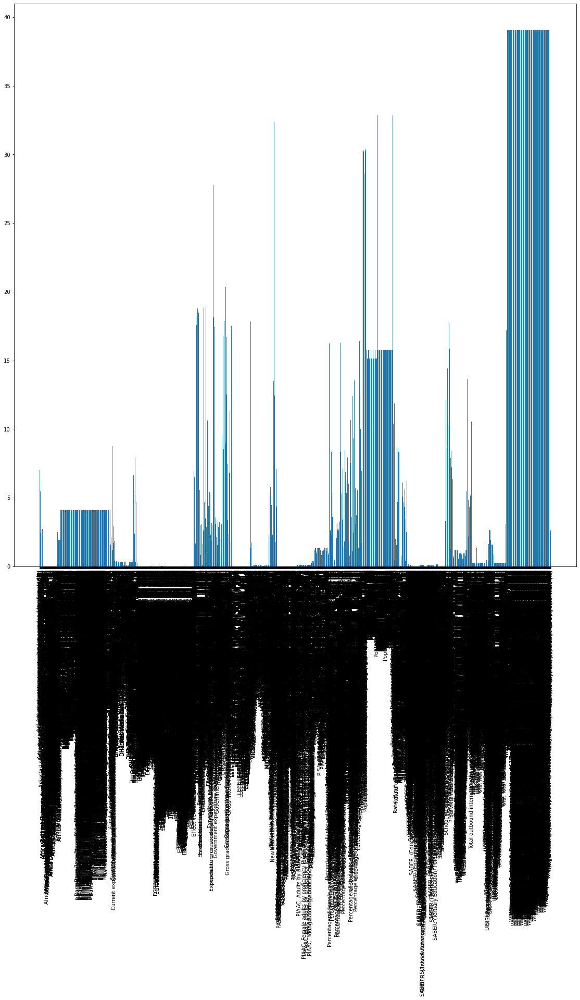

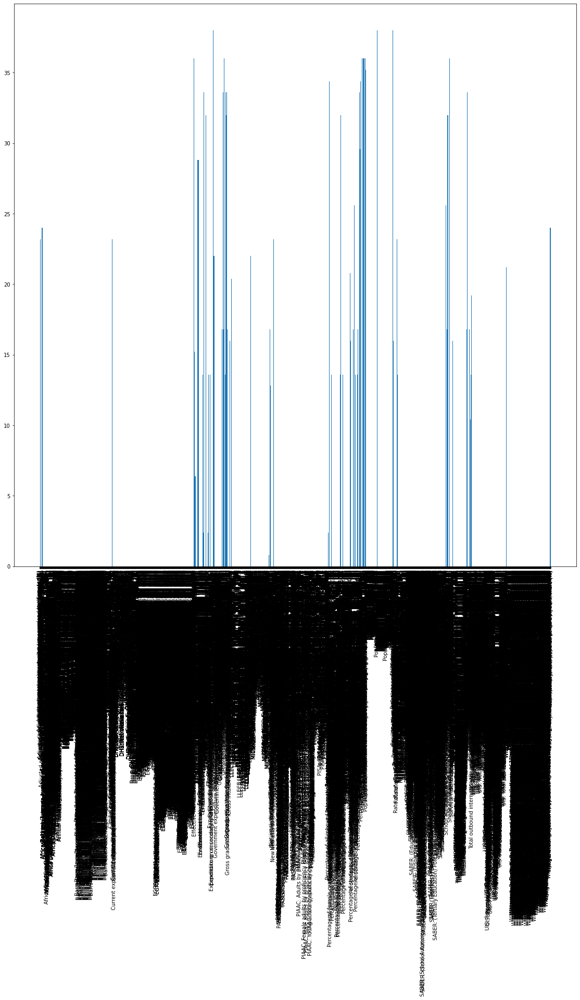

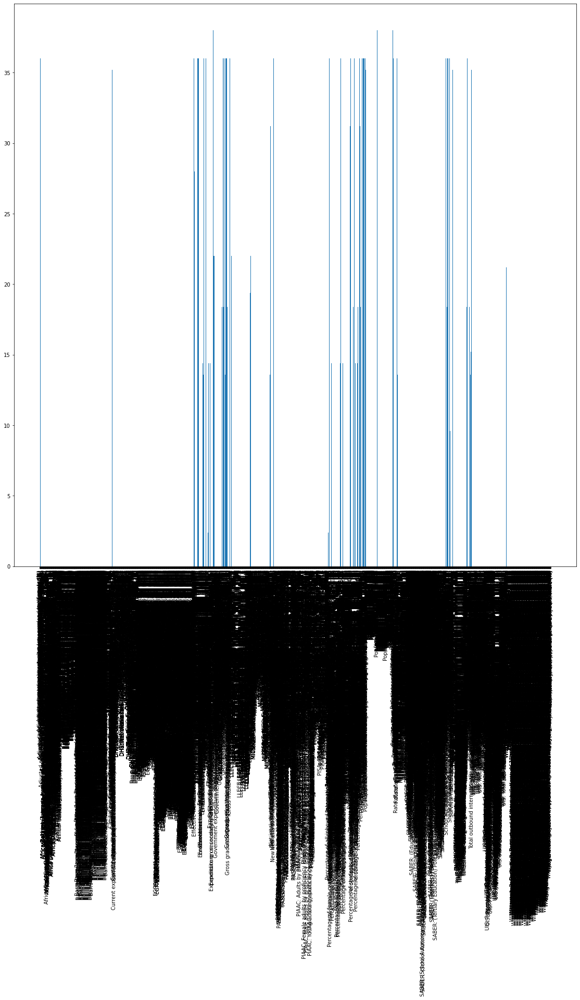

...

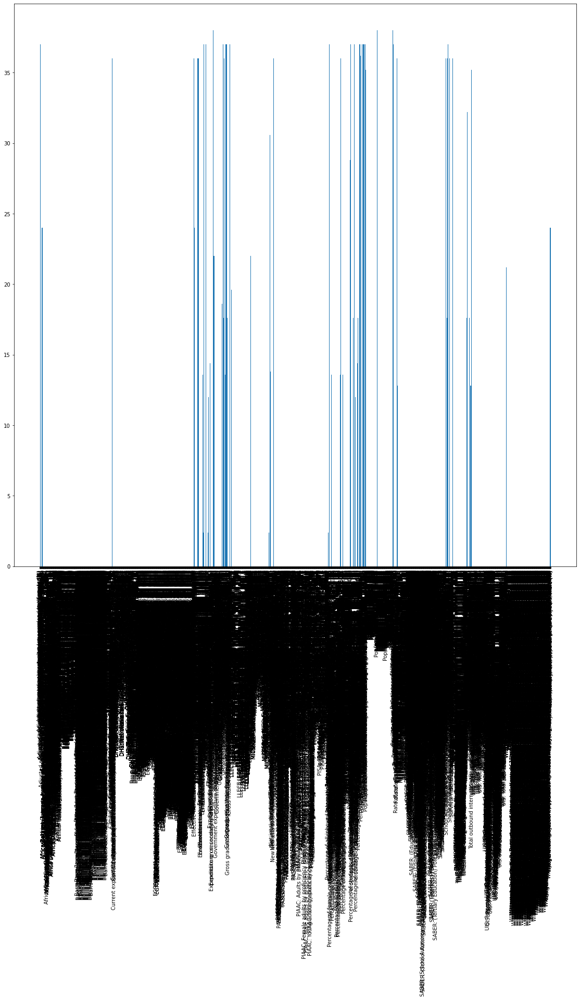

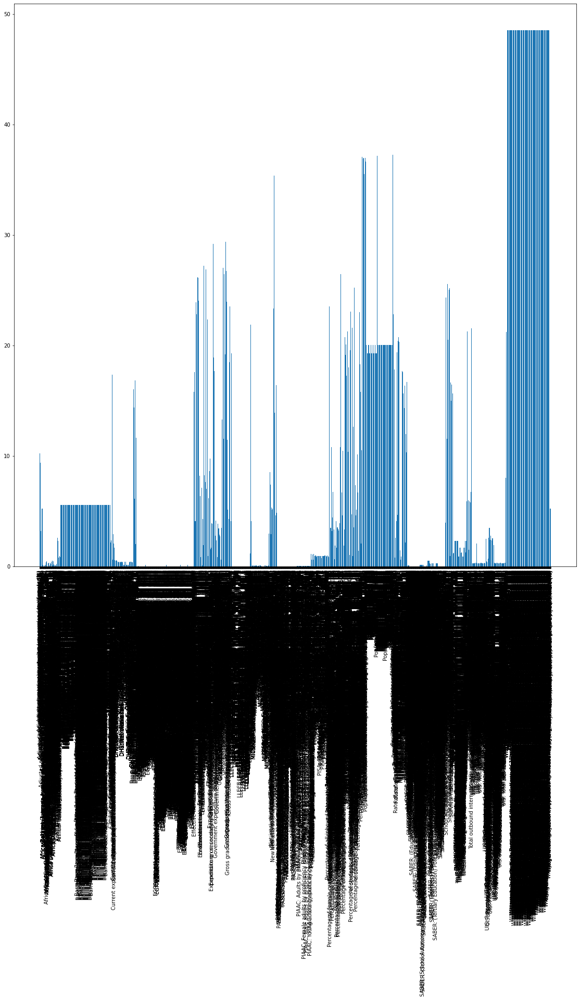

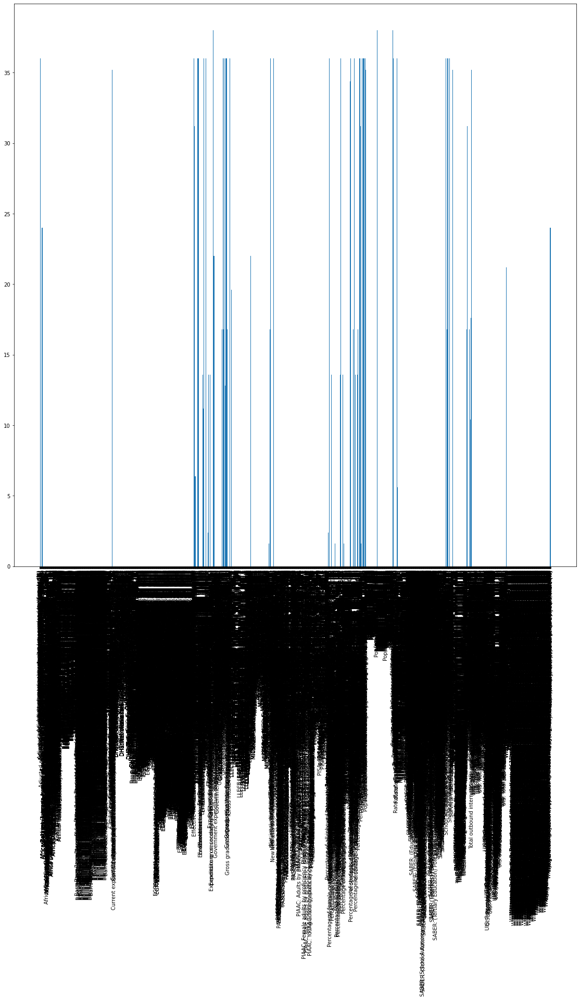

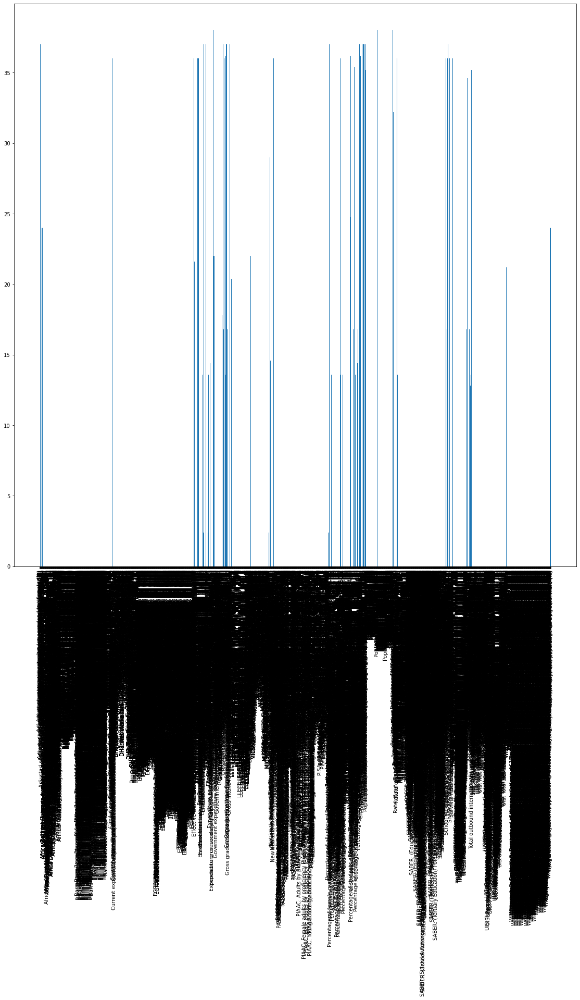

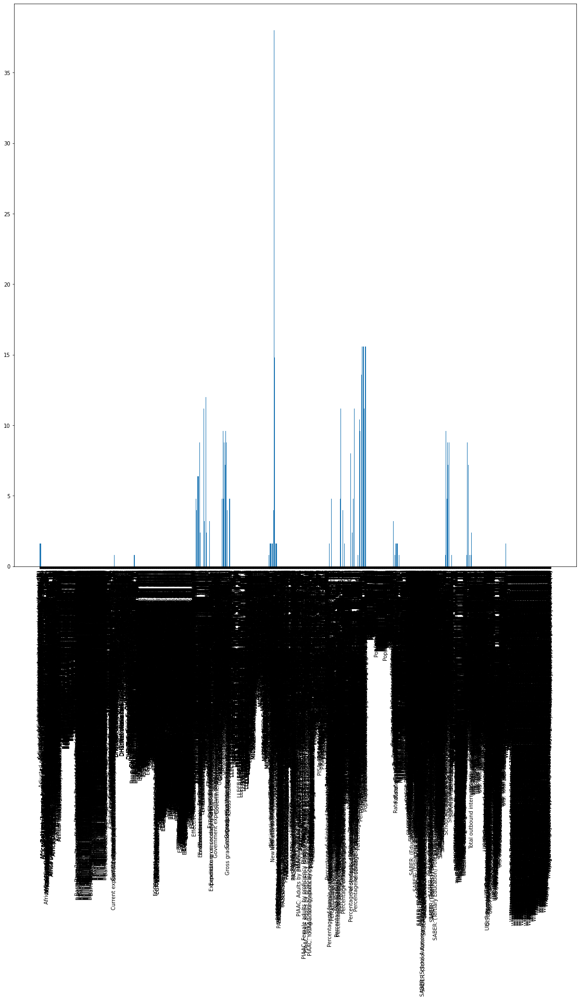

KeyboardInterrupt: 

In [8]:
def missing_discrete(d):
    k = d.iloc[:, 4:].isna().sum()
    print("Dans "+ d.name+" il y a " + str(k.values.sum())+ " données manquantes sur "+ str(d.iloc[:, 4:].size) + " au total, soit près de "+str(round(100*k.values.sum()/d.iloc[:, 4:].size,2)) +"% de la donnée")

def missing_percentage(d, name):
    print("Dans "+ name+" il y a " + str(round(100-d.mean(axis=1).values.mean(),2))+"% de données manquante")
    return(round(100-d.mean(axis=1).values.mean(),2))

def missing_value_per_period(df, start, end):
    #on définit la surface d'étude: année de début et de fin et on compte les nan sur ces années
    k = df.iloc[:, start:end].notna().sum(axis=1)
    #on fait la moyenne des values existantes sur la période
#     l = pd.DataFrame(100*k/(df.iloc[0,start:end].size), columns=[str(2020+start)+str("-")+str(2020+end)])
    l = pd.DataFrame(100*k/(df.iloc[0,start:end].size), columns=[str(df.columns.values[start])+str("-")+str(df.columns.values[end])])
    #on join les indicateurs du dataset aux moyennes de donnée présentes puis on jette les variables inutiles au calcul
    df_mean_na = df.iloc[:,0:5].join(l)
    df_mean_na = df_mean_na.drop(["Country Code", "Country Name", "Indicator Code"], axis=1)
    #on regroupe le tout par région et par indicateur
    k = df_mean_na.groupby(["Region", "Indicator Name"])[str(df.columns.values[start])+str("-")+str(df.columns.values[end])].mean()
    del df_mean_na
    return(k)    

print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
periods = [*range(-65, -16, 5)]+[*range(-16, -1, 1)]
l = []
for i in range(len(periods)):
    if i!=(len(periods)-1):
        l.append(missing_value_per_period(df_1, periods[i], periods[i+1]))
    else:
        print(periods[i])
        l.append(missing_value_per_period(df_1, periods[i], -1))

to_graph = pd.DataFrame(l).transpose()
#to_graph = to_graph[to_graph.iloc[:,:].sum(axis=1)>0] #à commenter décommenter pour avoir ou non les lignes sans donnée
dico_region = {}
for region in to_graph.index.get_level_values(0).unique():
    dico_region[region] = to_graph.loc[region]

new_l=[]
missing_discrete(data)
print("\n")
for i in dico_region.keys():
    dico_region[i].name = i
    #new_l.append(missing_percentage(dico_region[i].iloc[:,:], i))
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_axes([0,0,1,1])
    ax.bar(dico_region[i].index.values,dico_region[i].mean(axis=1))
    plt.xticks(rotation=90)
    plt.show()
    print("\n")

In [99]:
#3 Sélectionner les informations qui semblent pertinentes pour répondre à la problématique (quelles sont les colonnes contenant des informations qui peuvent être utiles pour répondre à la problématique de l’entreprise ?)
#4 Déterminer des ordres de grandeurs des indicateurs statistiques classiques pour les différentes zones géographiques et pays du monde (moyenne/médiane/écart-type par pays et par continent ou bloc géographique)
# dico_region.keys()
l = ["Barro-Lee: Population in thousands, age 15-19, total",
"Barro-Lee: Population in thousands, age 20-24, total",
"Barro-Lee: Percentage of population age 15-19 with primary schooling. Completed Primary",
"Barro-Lee: Percentage of population age 20-24 with primary schooling. Completed Primary",
"Barro-Lee: Percentage of population age 15-19 with secondary schooling. Completed Secondary",
"Barro-Lee: Percentage of population age 20-24 with secondary schooling. Completed Secondary",
"Barro-Lee: Percentage of population age 15-19 with tertiary schooling. Completed Tertiary",
"Barro-Lee: Percentage of population age 20-24 with tertiary schooling. Completed Tertiary"]
indic_list = []
for indicator in data_series["Indicator Name"].values:
    if any(word in str(indicator) for word in indic_key):
        if any(word in str(indicator) for word in less_key):
            pass
        else:
            indic_list.append(indicator)
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
dico_region = {}
for region in df_1["Region"].unique():
    print(region)
    dico_region[region] =df_1[df_1["Region"]==region]
    dico_region[region] = dico_region[region][dico_region[region]["Indicator Name"].isin(indic_list)]
    dico_region[region] = dico_region[region][dico_region[region].iloc[:,5:].sum(axis=1)>0]

1
2
3
Arab World
East Asia & Pacific
East Asia & Pacific (excluding high income)
Euro area
Europe & Central Asia
Europe & Central Asia (excluding high income)
European Union
Heavily indebted poor countries (HIPC)
High income
Latin America & Caribbean
Latin America & Caribbean (excluding high income)
Least developed countries: UN classification
Low & middle income
Low income
Lower middle income
Middle East & North Africa
Middle East & North Africa (excluding high income)
Middle income
North America
OECD members
South Asia
Sub-Saharan Africa
Sub-Saharan Africa (excluding high income)
Upper middle income
World
British Virgin Islands
Gibraltar
Nauru


In [100]:
# df_1.iloc[0:1,:]

for region in dico_region.keys():
    print("dans la région "+str(region)+" il y a "+ str(dico_region[region].index.size)+" indicateurs dispo\n")

dans la région Arab World il y a 3 indicateurs dispo

dans la région East Asia & Pacific il y a 655 indicateurs dispo

dans la région East Asia & Pacific (excluding high income) il y a 2 indicateurs dispo

dans la région Euro area il y a 0 indicateurs dispo

dans la région Europe & Central Asia il y a 1277 indicateurs dispo

dans la région Europe & Central Asia (excluding high income) il y a 3 indicateurs dispo

dans la région European Union il y a 0 indicateurs dispo

dans la région Heavily indebted poor countries (HIPC) il y a 3 indicateurs dispo

dans la région High income il y a 0 indicateurs dispo

dans la région Latin America & Caribbean il y a 849 indicateurs dispo

dans la région Latin America & Caribbean (excluding high income) il y a 3 indicateurs dispo

dans la région Least developed countries: UN classification il y a 3 indicateurs dispo

dans la région Low & middle income il y a 2 indicateurs dispo

dans la région Low income il y a 3 indicateurs dispo

dans la région Lower

In [2]:
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
dico_region = {}
for region in df_1["Region"].unique():
    print(region)
    dico_region[region] = df_1[df_1["Region"]==region]
    dico_region[region] = dico_region[region][dico_region[region].iloc[:,5:].notna().sum(axis=1)>0]
    print("nb indic= "+str(dico_region[region].index.size))
    print("nb de pays= "+str(len(dico_region[region]["Country Name"].unique())))

1
2
3
Arab World
nb indic= 374
nb de pays= 1
East Asia & Pacific
nb indic= 48061
nb de pays= 37
East Asia & Pacific (excluding high income)
nb indic= 354
nb de pays= 1
Euro area
nb indic= 349
nb de pays= 1
Europe & Central Asia
nb indic= 94832
nb de pays= 58
Europe & Central Asia (excluding high income)
nb indic= 363
nb de pays= 1
European Union
nb indic= 336
nb de pays= 1
Heavily indebted poor countries (HIPC)
nb indic= 371
nb de pays= 1
High income
nb indic= 343
nb de pays= 1
Latin America & Caribbean
nb indic= 61534
nb de pays= 42
Latin America & Caribbean (excluding high income)
nb indic= 379
nb de pays= 1
Least developed countries: UN classification
nb indic= 371
nb de pays= 1
Low & middle income
nb indic= 352
nb de pays= 1
Low income
nb indic= 371
nb de pays= 1
Lower middle income
nb indic= 358
nb de pays= 1
Middle East & North Africa
nb indic= 37759
nb de pays= 22
Middle East & North Africa (excluding high income)
nb indic= 375
nb de pays= 1
Middle income
nb indic= 354
nb de pay

In [4]:
dico_region["North America"].iloc[0:2,:]

,Country Name,Country Code,Region,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
65974,North America,NAC,North America,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,NaN,NaN,NaN,NaN,82.152191,82.088829,82.991943,83.412041,84.013069,83.877182,91.050491,91.093689,93.448311,92.45694,91.616867,91.977257,93.434151,94.959846,95.900230,96.856056,97.781479,97.985481,97.074318,96.035713,95.637451,96.779953,96.344078,96.927399,97.501534,97.722260,97.827591,97.500771,96.262680,95.787811,94.738426,95.405769,96.436829,97.287453,97.498016,96.257874,95.098022,94.282379,94.547943,93.322838,94.478439,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65975,North America,NAC,North America,"Adjusted net enrolment rate, primary, female (%)",SE.PRM.TENR.FE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.166550,94.398270,95.946983,96.782059,97.523552,98.353630,98.174583,97.208443,95.971313,95.883583,96.851341,96.571877,97.173149,97.743240,97.980629,97.939072,98.178818,97.013451,96.415123,95.446854,96.155411,97.399887,97.952904,97.981102,97.267632,95.451668,95.000710,94.552780,93.194382,94.853951,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


--------------------
Adjusted net enrolment rate, lower secondary, both sexes (%)
moy:
 94.1159515380859
med:
 94.1159515380859
var:
 0.0
ect:
 0.0
skw:
 nan
kur:
 nan


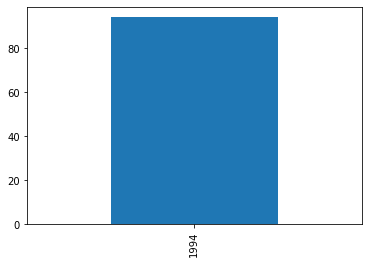

--------------------
Adjusted net enrolment rate, lower secondary, female (%)
moy:
 93.7625274658203
med:
 93.7625274658203
var:
 0.0
ect:
 0.0
skw:
 nan
kur:
 nan


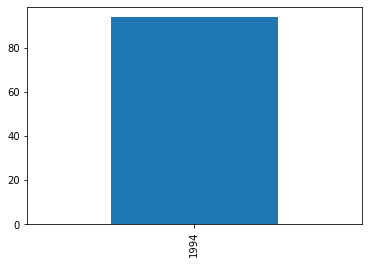

--------------------
Adjusted net enrolment rate, lower secondary, gender parity index (GPI)
moy:
 0.992720007896423
med:
 0.992720007896423
var:
 0.0
ect:
 0.0
skw:
 nan
kur:
 nan


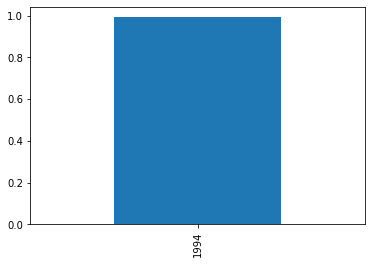

--------------------
Adjusted net enrolment rate, lower secondary, male (%)
moy:
 94.45046997070308
med:
 94.45046997070308
var:
 0.0
ect:
 0.0
skw:
 nan
kur:
 nan


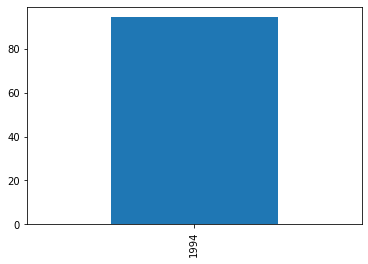

--------------------
Adjusted net enrolment rate, primary, both sexes (%)
moy:
 99.65970993041994
med:
 99.63002395629886
var:
 0.039580462107546975
ect:
 0.19894839056284666
skw:
 0.30223733830270566
kur:
 -4.207272024559421


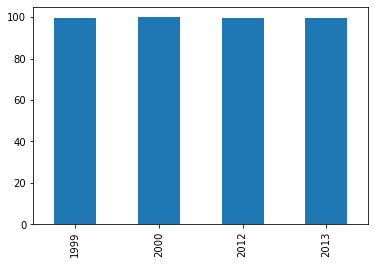

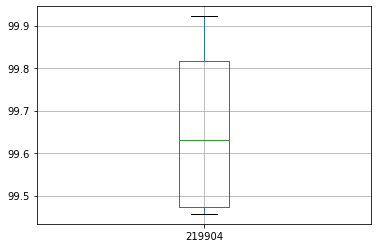

--------------------
Adjusted net enrolment rate, primary, female (%)
moy:
 99.85214233398442
med:
 99.85214233398442
var:
 0.0
ect:
 0.0
skw:
 nan
kur:
 nan


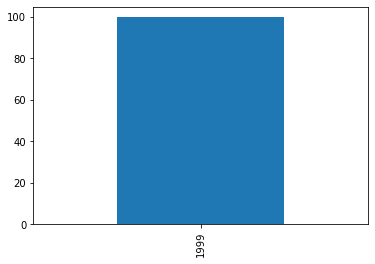

--------------------
Adjusted net enrolment rate, primary, gender parity index (GPI)
moy:
 0.9933988241588366
med:
 0.995130002498627
var:
 4.286164165025368e-05
ect:
 0.006546880299062576
skw:
 -0.15612693845675749
kur:
 0.08195479915919801


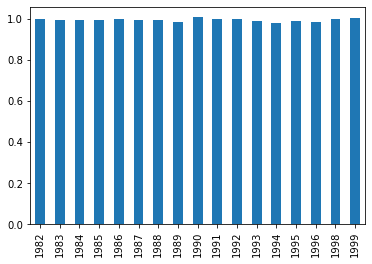

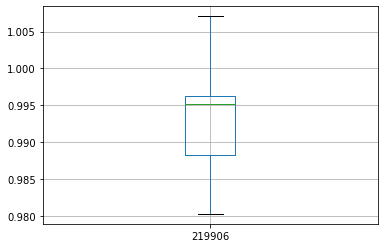

--------------------
Adjusted net enrolment rate, primary, male (%)
moy:
 99.7162933349609
med:
 99.7162933349609
var:
 0.0
ect:
 0.0
skw:
 nan
kur:
 nan


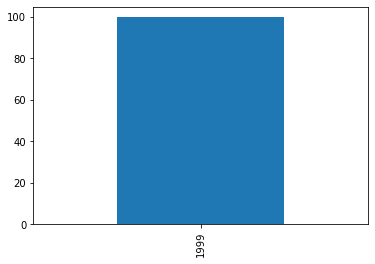

--------------------
Adjusted net enrolment rate, upper secondary, both sexes (%)
moy:
 84.8774452209473
med:
 84.8774452209473
var:
 0.12135074591787504
ect:
 0.34835433959960227
skw:
 nan
kur:
 nan


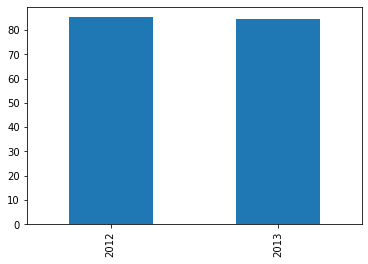

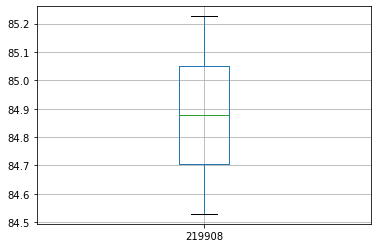

--------------------
Adjusted net enrolment rate, upper secondary, female (%)
moy:
 84.78052520751955
med:
 84.78052520751955
var:
 0.10687140753726473
ect:
 0.32691192626954546
skw:
 nan
kur:
 nan


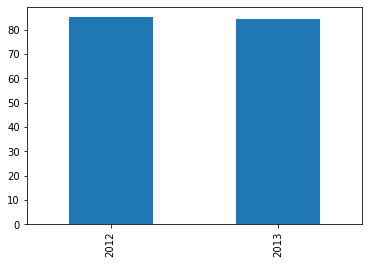

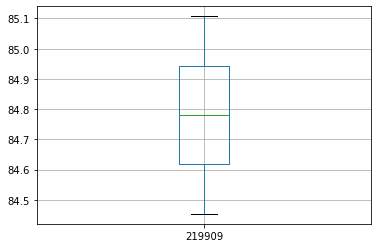

--------------------
Adjusted net enrolment rate, upper secondary, gender parity index (GPI)
moy:
 0.9977750182151797
med:
 0.9977750182151797
var:
 2.352279047103617e-07
ect:
 0.00048500299453752005
skw:
 nan
kur:
 nan


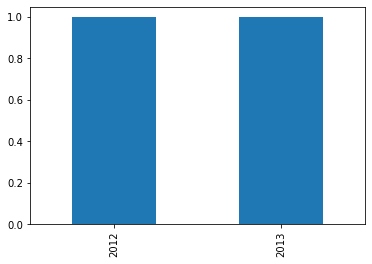

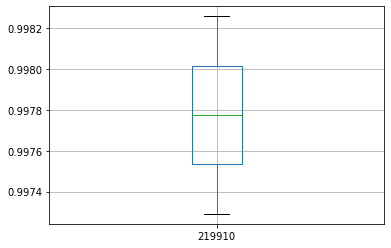

--------------------
Adjusted net enrolment rate, upper secondary, male (%)
moy:
 84.9697723388672
med:
 84.9697723388672
var:
 0.13607898732882226
ect:
 0.36888885498049717
skw:
 nan
kur:
 nan


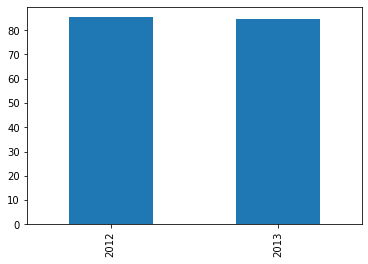

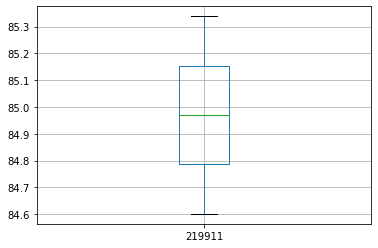

--------------------
Adjusted net intake rate to Grade 1 of primary education, both sexes (%)
moy:
 92.94668273925781
med:
 90.22875595092775
var:
 19.42432512232566
ect:
 4.407303611316749
skw:
 0.6017933070792123
kur:
 -1.6405914733556042


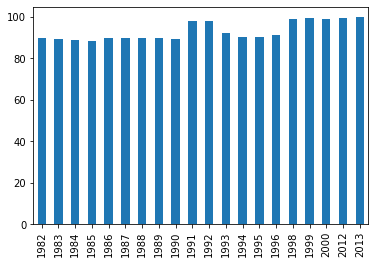

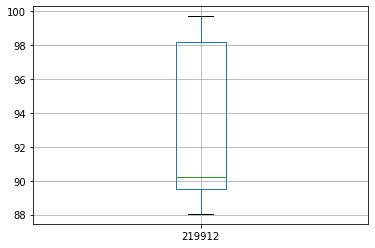

--------------------
Adjusted net intake rate to Grade 1 of primary education, female (%)
moy:
 93.24925384521484
med:
 90.86251831054685
var:
 16.597555877720048
ect:
 4.074009803341181
skw:
 0.6566817442678038
kur:
 -1.5098545769560672


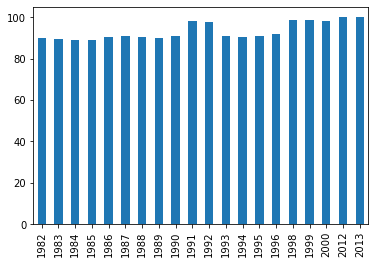

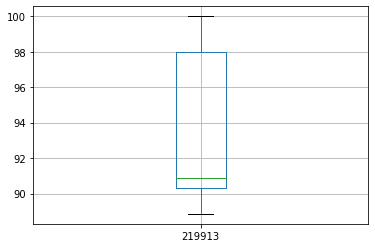

--------------------
Adjusted net intake rate to Grade 1 of primary education, gender parity index (GPI)
moy:
 1.006833505630493
med:
 1.00777500867844
var:
 0.00019359451526477183
ect:
 0.013913824609530329
skw:
 -0.6010440826842158
kur:
 0.007332670621816639


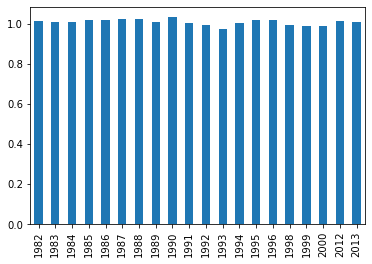

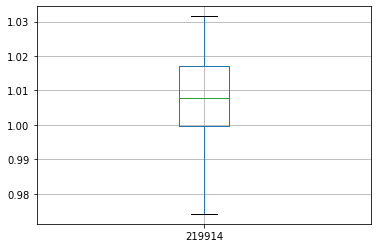

In [138]:
k = dico_region["North America"][dico_region["North America"]["Country Name"]=="Canada"].iloc[0:15,:]
# k.mean( axis= 1, skipna=True)


for val in k["Indicator Name"].unique():
    subset = k[k["Indicator Name"]==val].iloc[:,5:].dropna(axis=1)
    print("-"*20)
    print(val)
#     print("macarena")
#     print(subset)
#     print("mocoreno")
    print("moy:\n",subset.mean(axis=1).values[0])
    print("med:\n",subset.median(axis=1).values[0])
#     print("mod:\n",subset.mode().values[0])
    print("var:\n",subset.var(axis=1,ddof=0).values[0])
    print("ect:\n",subset.std(axis=1,ddof=0).values[0])
    print("skw:\n",subset.skew(axis=1).values[0])
    print("kur:\n",subset.kurtosis(axis=1).values[0])
    subset.iloc[0,:].plot.bar()
    plt.show()
    if subset.values.size >1:
        subset.T.boxplot()
        plt.show()

In [30]:
l_15_19 = ["Barro-Lee: Percentage of population age 15-19 with primary schooling. Completed Primary",
"Barro-Lee: Percentage of population age 15-19 with secondary schooling. Completed Secondary",
"Barro-Lee: Population in thousands, age 15-19, total"]

l_20_24 = ["Barro-Lee: Population in thousands, age 20-24, total",
"Barro-Lee: Percentage of population age 20-24 with primary schooling. Completed Primary",
"Barro-Lee: Percentage of population age 20-24 with primary schooling. Total (Incomplete and Completed Primary)",
"Barro-Lee: Percentage of population age 20-24 with secondary schooling. Completed Secondary",
"Barro-Lee: Percentage of population age 20-24 with secondary schooling. Total (Incomplete and Completed Secondary)",
"Barro-Lee: Percentage of population age 20-24 with tertiary schooling. Completed Tertiary",
"Barro-Lee: Percentage of population age 20-24 with tertiary schooling. Total (Incomplete and Completed Tertiary)"]


    
# Barro-Lee: Percentage of population age 25+ with tertiary schooling. Completed Tertiary
# Barro-Lee: Percentage of population age 25+ with tertiary schooling. Total (Incomplete and Completed Tertiary)
    
l_wig = ["Wittgenstein Projection: Population age 20-24 in thousands by highest level of educational attainment. Upper Secondary. Total",
"Wittgenstein Projection: Population age 20-24 in thousands by highest level of educational attainment. Post Secondary. Total"]
# Barro-Lee: Population in thousands, age 25+, total
# Barro-Lee: Population in thousands, age 25-29, total

l_pt_ratio = ["Pupil-teacher ratio in primary education (headcount basis)",
"Pupil-teacher ratio in secondary education (headcount basis)",
"Pupil-teacher ratio in tertiary education (headcount basis)"]
    
l_wig_meany = ["Wittgenstein Projection: Mean years of schooling. Age 15-19. Total",
"Wittgenstein Projection: Mean years of schooling. Age 20-24. Total",
"Wittgenstein Projection: Mean years of schooling. Age 25-29. Total"]
    
l_wig_highedu = ["Wittgenstein Projection: Percentage of the population age 15-19 by highest level of educational attainment. Upper Secondary. Total",
"Wittgenstein Projection: Percentage of the population age 15-19 by highest level of educational attainment. Post Secondary. Total",
"Wittgenstein Projection: Percentage of the population age 20-24 by highest level of educational attainment. Upper Secondary. Total",
"Wittgenstein Projection: Percentage of the population age 20-24 by highest level of educational attainment. Post Secondary. Total"
]      
#à mettre en relief avec quel pourcentage de ces tranches d'âge s'arrête en 2nd et quel pourcentage va plus loin

df_NA[df_NA["Indicator Name"].isin(l_wig_highedu)].dropna(axis=1)


,Country Name,Country Code,Region,Indicator Name,Indicator Code,2010,2015,2020,2025,2030,2035,2040,2045,2050,2055,2060,2065,2070,2075,2080,2085,2090,2095,2100
223316,Canada,CAN,North America,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.1519.4.MF,0.04,0.04,0.04,0.04,0.04,0.04,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
223322,Canada,CAN,North America,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.1519.3.MF,0.66,0.68,0.70,0.71,0.72,0.73,0.74,0.75,0.76,0.76,0.77,0.77,0.78,0.78,0.78,0.79,0.79,0.79,0.79
223334,Canada,CAN,North America,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2024.4.MF,0.42,0.43,0.45,0.46,0.46,0.47,0.48,0.48,0.49,0.49,0.50,0.50,0.50,0.51,0.51,0.51,0.51,0.52,0.52
223340,Canada,CAN,North America,Wittgenstein Projection: Percentage of the pop...,PRJ.ATT.2024.3.MF,0.54,0.53,0.52,0.52,0.51,0.51,0.50,0.50,0.49,0.49,0.49,0.48,0.48,0.48,0.48,0.48,0.47,0.47,0.47


1
2
3
-2
Dans data il y a 53455179 données manquantes sur 58537380 au total, soit près de 91.32% de la donnée


Dans Arab World il y a 99.0% de données manquante


Dans British Virgin Islands il y a 99.0% de données manquante


Dans East Asia & Pacific il y a 99.0% de données manquante


Dans East Asia & Pacific (excluding high income) il y a 99.0% de données manquante


Dans Euro area il y a 99.0% de données manquante


Dans Europe & Central Asia il y a 99.0% de données manquante


Dans Europe & Central Asia (excluding high income) il y a 99.0% de données manquante


Dans European Union il y a 99.0% de données manquante


Dans Gibraltar il y a 99.0% de données manquante


Dans Heavily indebted poor countries (HIPC) il y a 99.0% de données manquante


Dans High income il y a 99.0% de données manquante


Dans Latin America & Caribbean il y a 99.0% de données manquante


Dans Latin America & Caribbean (excluding high income) il y a 99.0% de données manquante


Dans Least developed countr

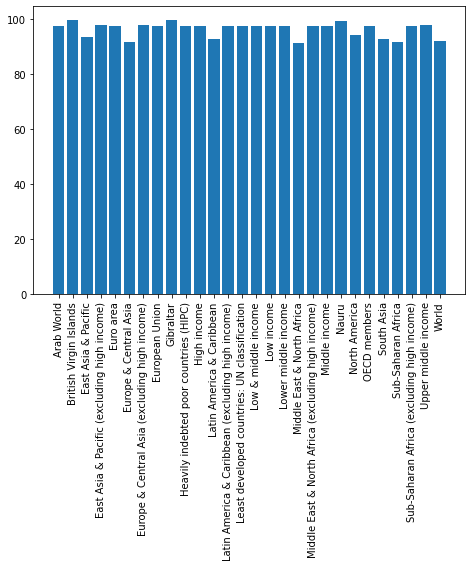

In [32]:
#trouvons les régions avec la meilleur densité d'information puis les pays
#1 Valider la qualité de ce jeu de données (comporte-t-il beaucoup de données manquantes, dupliquées ?)
def missing_discrete(d):
    k = d.iloc[:, 4:].isna().sum()
    print("Dans "+ d.name+" il y a " + str(k.values.sum())+ " données manquantes sur "+ str(d.iloc[:, 4:].size) + " au total, soit près de "+str(round(100*k.values.sum()/d.iloc[:, 4:].size,2)) +"% de la donnée")

def missing_percentage(d, name):
    print("Dans "+ name+" il y a " + str(round(100-d.notna().mean(axis=1).values.mean(),2))+"% de données manquante")
    return(round(100-d.mean(axis=1).values.mean(),2))

def missing_value_per_period(df, start, end):
    #on définit la surface d'étude: année de début et de fin et on compte les nan sur ces années
    k = df.iloc[:, start:end].notna().sum(axis=1)
    #on fait la moyenne des values existantes sur la période
#     l = pd.DataFrame(100*k/(df.iloc[0,start:end].size), columns=[str(2020+start)+str("-")+str(2020+end)])
    l = pd.DataFrame(100*k/(df.iloc[0,start:end].size), columns=[str(df.columns.values[start])+str("-")+str(df.columns.values[end])])
    #on join les indicateurs du dataset aux moyennes de donnée présentes puis on jette les variables inutiles au calcul
    df_mean_na = df.iloc[:,0:5].join(l)
    df_mean_na = df_mean_na.drop(["Country Code", "Country Name", "Indicator Code"], axis=1)
    #on regroupe le tout par région et par indicateur
    k = df_mean_na.groupby(["Region", "Indicator Name"])[str(df.columns.values[start])+str("-")+str(df.columns.values[end])].mean()
    del df_mean_na
    return(k)    

print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])

periods = [*range(-65, -16, 5)]+[*range(-16, -1, 1)]
l = []
for i in range(len(periods)):
    if i!=(len(periods)-1):
        l.append(missing_value_per_period(df_1, periods[i], periods[i+1]))
    else:
        print(periods[i])
        l.append(missing_value_per_period(df_1, periods[i], -1))

to_graph = pd.DataFrame(l).transpose()
#to_graph = to_graph[to_graph.iloc[:,:].sum(axis=1)>0] #à commenter décommenter pour avoir ou non les lignes sans donnée
dico_region = {}
for region in to_graph.index.get_level_values(0).unique():
    dico_region[region] = to_graph.loc[region]

new_l=[]
missing_discrete(data)
print("\n")
for i in dico_region.keys():
    dico_region[i].name = i
    new_l.append(missing_percentage(dico_region[i].iloc[:,:], i))
    print("\n")    

    
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(dico_region.keys(),new_l)
plt.xticks(rotation=90)
plt.show()


# print(dico_region.keys())
# dico_region["World"].iloc[0:3,:]

1
2
3

World
Avant évacuation des lignes vides:
Dans World il y a 92.63% de données manquante
Après évacuation des lignes vides:
Dans World il y a 59.24% de données manquante


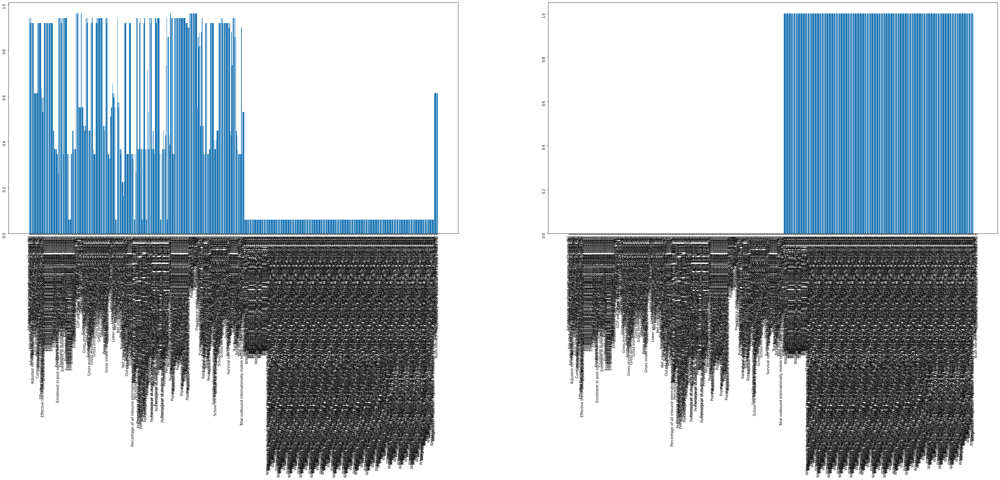

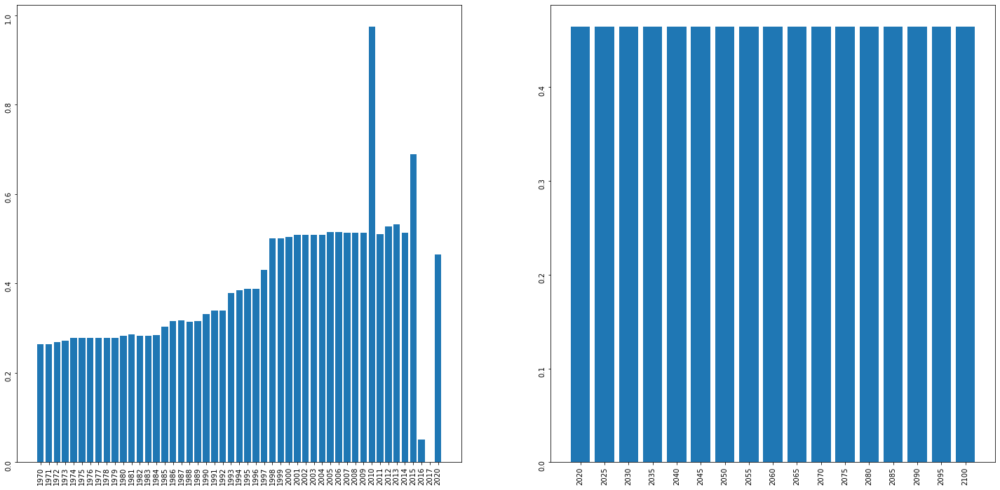

In [18]:
def missing_percentage(d, name):
    print("Dans "+ name+" il y a " + str(round(100*(d.isna().mean().mean()),2))+"% de données manquante")
    return(round(100*(d.isna().mean().mean()),2))

def repartition_indic(d, name):
    l = dico_region["World"].iloc[:,5:].notna().mean(axis=1)
    fig = plt.figure(figsize=(8,8))
    l.plot.bar()
    plt.show()
    
def repartition_indic(d, name):
    l2 = d.loc[:,"1970":"2020"].notna().mean(axis=1)
    l3 = d.loc[:,"2020":"2100"].notna().mean(axis=1)
    fig, ax = plt.subplots(1, 2, figsize=(50,12))
    # fig.suptitle('Horizontally stacked subplots')
    ax[0].bar(d["Indicator Name"].values, l2)
    ax[0].tick_params(labelrotation=90)
    ax[1].bar(d["Indicator Name"].values, l3)
    ax[1].tick_params(labelrotation=90)
    plt.show()
#     l = d.iloc[:,5:].notna().mean(axis=1)
#     fig = plt.figure(figsize=(8,8))
#     l.plot.bar()
#     plt.show()
    
def repartition_year(d, name):
    l2 = d.loc[:,"1970":"2020"].notna().mean(axis=0)
    l3 = d.loc[:,"2020":"2100"].notna().mean(axis=0)
    fig, ax = plt.subplots(1, 2, figsize=(25,12))
    # fig.suptitle('Horizontally stacked subplots')
    ax[0].bar(d.loc[:,"1970":"2020"].columns, l2)
    ax[0].tick_params(labelrotation=90)
    ax[1].bar(d.loc[:,"2020":"2100"].columns, l3)
    ax[1].tick_params(labelrotation=90)
    plt.show()
    

    
    
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
dico_region = {}
# for region in df_1["Region"].unique():
for region in ["World"]:
    print("\n"+region)
    dico_region[region] =df_1[df_1["Region"]==region]
    print("Avant évacuation des lignes vides:")
    missing_percentage(dico_region[region].iloc[:,5:], region)
    print("Après évacuation des lignes vides:")
    dico_region[region] = dico_region[region][dico_region[region].iloc[:,5:].notna().sum(axis=1)>0]
    missing_percentage(dico_region[region].iloc[:,5:], region)
    repartition_indic(dico_region[region], region)
    repartition_year(dico_region[region], region)

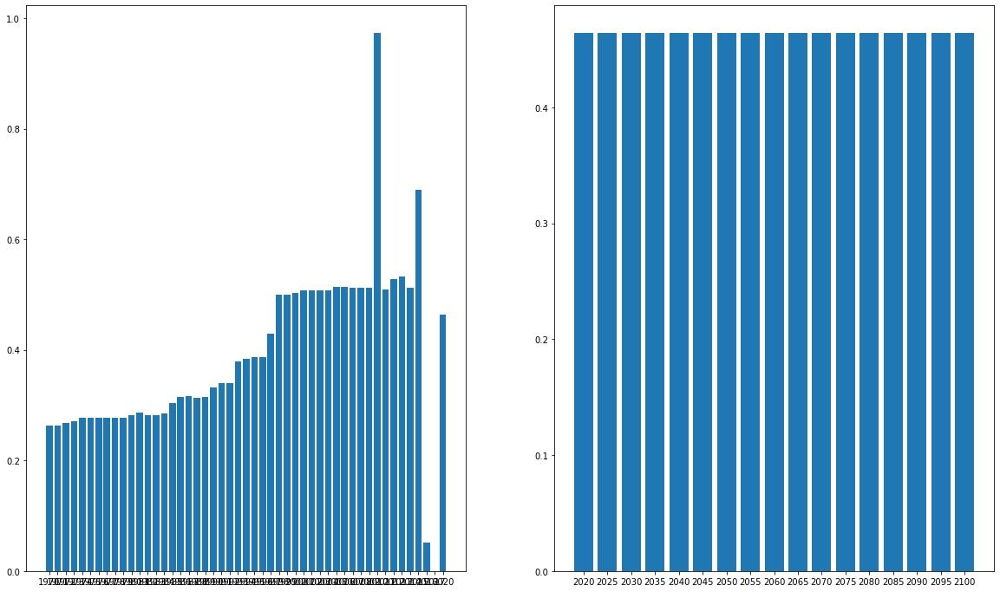

In [111]:
l1 = dico_region["World"].iloc[:,5:].notna().mean(axis=1)
l2 = dico_region["World"].loc[:,"1970":"2020"].notna().mean(axis=0)
l3 = dico_region["World"].loc[:,"2020":"2100"].notna().mean(axis=0)
# fig = plt.figure(figsize=(8,8))
# l.plot.bar()

# fig = plt.figure(figsize=(15,15))
fig, ax = plt.subplots(1, 2, figsize=(20,12))
# fig.suptitle('Horizontally stacked subplots')
ax[0].bar(l2.index, l2)
ax[1].bar(l3.index, l3)
plt.show()

# plt.figure(figsize=(15,15))
# plt.subplot(1, 2, 1)
# fig.suptitle('Horizontally stacked subplots')
# ax1.bar(l2.index, l2)
# plt.subplot(1, 2, 2)
# ax2.bar(l3.index, l3)
# plt.show()


In [ ]:
import scipy.stats as st
import numpy as np

dico_region["World"]["Indicator Name"].size

# dico_region["World"].iloc[:,5:].T.corr(method="pearson")
dico_region["World"].iloc[:,5:].T.cov()

In [9]:
# Il y a quelque chose que je ne comprends pas:
# Comment est-on censé faire cette analyse?
# qu'est-ce que je suis censé analyser?
# Analyser tous les pays et ensuite dire en quoi le jeu de donéne est viable?
# ou
# jouer quelque région, dire si le jeu est viable ou non sur ces régions et montrer ma méthode?
# je dois apporter un justificatif au choix de la région?

l = ["internet", "visio", "computer"]

print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])

for i in df_1["Indicator Name"].unique():
    print(i)
    
    
# trouver 
#Expenditure on education as % of total government expenditure (%)
# Expenditure on secondary as % of government expenditure on education (%)
# Expenditure on secondary as % of total government expenditure (%)
# Expenditure on tertiary as % of government expenditure on education (%)
# Expenditure on tertiary as % of total government expenditure (%)
# Government expenditure per secondary student (constant US$)
# Government expenditure per tertiary student (constant US$)
# PPP$
# Gross enrolment ratio, upper secondary, both sexes (%)
# Gross enrolment ratio, tertiary, both sexes (%)
#Personal computers (per 100 people)
#Population, ages 15-24, total
# Teachers in secondary general education, both sexes (number)
# Teachers in tertiary education programmes, both sexes (number)


1
2
3
Adjusted net enrolment rate, lower secondary, both sexes (%)
Adjusted net enrolment rate, lower secondary, female (%)
Adjusted net enrolment rate, lower secondary, gender parity index (GPI)
Adjusted net enrolment rate, lower secondary, male (%)
Adjusted net enrolment rate, primary, both sexes (%)
Adjusted net enrolment rate, primary, female (%)
Adjusted net enrolment rate, primary, gender parity index (GPI)
Adjusted net enrolment rate, primary, male (%)
Adjusted net enrolment rate, upper secondary, both sexes (%)
Adjusted net enrolment rate, upper secondary, female (%)
Adjusted net enrolment rate, upper secondary, gender parity index (GPI)
Adjusted net enrolment rate, upper secondary, male (%)
Adjusted net intake rate to Grade 1 of primary education, both sexes (%)
Adjusted net intake rate to Grade 1 of primary education, female (%)
Adjusted net intake rate to Grade 1 of primary education, gender parity index (GPI)
Adjusted net intake rate to Grade 1 of primary education, male (%

In [17]:
#étude par pays: nombre indic non vide par pays
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
dico_pays = {}
count = 0
for pays in df_1["Country Name"].unique():
    dico_pays[pays] = df_1[df_1["Country Name"]==pays]
    dico_pays[pays] = dico_pays[pays][dico_pays[pays].iloc[:,5:].notna().sum(axis=1)>0]
    nb_indic = dico_pays[pays].index.size
    if nb_indic==0:
        del dico_pays[pays]
        count += 1
    else:
        print(pays)
        print("nb indic= "+str(dico_pays[pays].index.size))
        print("\n")
print(count)

1
2
3
Arab World
nb indic= 374


East Asia & Pacific
nb indic= 349


East Asia & Pacific (excluding high income)
nb indic= 354


Euro area
nb indic= 349


Europe & Central Asia
nb indic= 364


Europe & Central Asia (excluding high income)
nb indic= 363


European Union
nb indic= 336


Heavily indebted poor countries (HIPC)
nb indic= 371


High income
nb indic= 343


Latin America & Caribbean
nb indic= 366


Latin America & Caribbean (excluding high income)
nb indic= 379


Least developed countries: UN classification
nb indic= 371


Low & middle income
nb indic= 352


Low income
nb indic= 371


Lower middle income
nb indic= 358


Middle East & North Africa
nb indic= 369


Middle East & North Africa (excluding high income)
nb indic= 375


Middle income
nb indic= 354


North America
nb indic= 315


OECD members
nb indic= 358


South Asia
nb indic= 358


Sub-Saharan Africa
nb indic= 382


Sub-Saharan Africa (excluding high income)
nb indic= 382


Upper middle income
nb indic= 356


World
n

In [ ]:
# Valider la qualité de ce jeu de données (comporte-t-il beaucoup de données manquantes, dupliquées ?)
##fait
# Décrire les informations contenues dans le jeu de données (nombre de colonnes ? nombre de lignes ?)
##fait
# Sélectionner les informations qui semblent pertinentes pour répondre à la problématique (quelles sont les colonnes contenant des informations qui peuvent être utiles pour répondre à la problématique de l’entreprise ?)
##à améliorer?
# Déterminer des ordres de grandeurs des indicateurs statistiques classiques pour les différentes zones géographiques et pays du monde (moyenne/médiane/écart-type par pays et par continent ou bloc géographique)
##+ou-fait

# Il faut que j'assemble le tout et que j'en fasse un rapport


In [43]:
#A la recherche d'ordinateur et d'internet
indic_key = ["internet", "computer", "distance", "visio", "equipment"]
# data_series[data_series["Short definition"].isin(l)]
indic_key_c = [x.capitalize() for x in indic_key] 
# for indicator in data_series["Long definition"]:
#     if any(word in str(indicator) for word in indic_key):
#             print(indicator)
#             print("\n")
# for indicator in data_series["Indicator Name"]:
#     if any(word in str(indicator) for word in indic_key_c):
#             print(indicator)
#             print("\n")
            
l = ["Personal computers are self-contained computers designed to be used by a single individual.",
"Internet users are individuals who have used the Internet (from any location) in the last 3 months. The Internet can be used via a computer, mobile phone, personal digital assistant, games machine, digital TV etc."]
data_series[data_series["Long definition"].isin(l)]
# data_series[data_series["Long definition"]=="Internet users are individuals who have used the Internet (from any location) in the last 3 months. The Internet can be used via a computer, mobile phone, personal digital assistant, games machine, digital TV etc."]

#On en retire deux indicators utiles
l_int= ["Personal computers (per 100 people)", "Internet users (per 100 people)"]

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
610,IT.CMP.PCMP.P2,Infrastructure: Communications,Personal computers (per 100 people),NaN,Personal computers are self-contained computer...,NaN,Annual,NaN,NaN,Weighted average,NaN,NaN,Restricted use: Please cite the International ...,"International Telecommunication Union, World T...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
611,IT.NET.USER.P2,Infrastructure: Communications,Internet users (per 100 people),NaN,Internet users are individuals who have used t...,NaN,Annual,NaN,NaN,Weighted average,Operators have traditionally been the main sou...,NaN,Please cite the International Telecommunicatio...,"International Telecommunication Union, World T...",NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [105]:
#étude par pays: nombre indic non vide par pays dans liste intérêt
# l_int= ["Personal computers (per 100 people)", "Internet users (per 100 people)", "GDP per capita (current US$)"]

# l_15_19=["Wittgenstein Projection: Population age 15-19 in thousands by highest level of educational attainment. Lower Secondary. Total"
# "Wittgenstein Projection: Population age 15-19 in thousands by highest level of educational attainment. Post Secondary. Total"
# "Wittgenstein Projection: Population age 15-19 in thousands by highest level of educational attainment. Upper Secondary. Total"]

# l_20_24 = ["Wittgenstein Projection: Population age 20-24 in thousands by highest level of educational attainment. Post Secondary. Total",
# "Wittgenstein Projection: Population age 20-24 in thousands by highest level of educational attainment. Upper Secondary. Total"]

l_int=['NY.GDP.PCAP.CD', 'IT.NET.USER.P2', 'IT.CMP.PCMP.P2']
l_15_19=["PRJ.POP.1519.2.MF", "PRJ.POP.1519.4.MF","PRJ.POP.1519.3.MF"]
l_20_24=["PRJ.POP.2024.2.MF", "PRJ.POP.2024.4.MF", "PRJ.POP.2024.3.MF"]

l_tot = l_int+ l_15_19+ l_20_24
# l_tot = l_15_19
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
df_1 = df_1.drop(columns="Indicator Name")
df_1 = df_1.drop(df_1[df_1["Country Name"]=="World"].index)

df_1 = df_1[df_1["Indicator Code"].isin(l_tot)]
df_1 = df_1[df_1.iloc[:,4:].notna().sum(axis=1)>0]
print("nombre de pays restants"+str(df_1["Country Name"].unique().size))
l = df_1.groupby(["Country Name"]).size()
l = l.sort_values(ascending=False)
l 
# dico_pays = {}
# count = 0
# for pays in df_1["Country Name"].unique():
#     dico_pays[pays] = df_1[df_1["Country Name"]==pays]
#     dico_pays[pays] = dico_pays[pays][dico_pays[pays]["Indicator Code"].isin(l_tot)]
#     dico_pays[pays] = dico_pays[pays][dico_pays[pays].iloc[:,5:].notna().sum(axis=1)>0]
#     nb_indic = dico_pays[pays].index.size
#     if nb_indic==0:
#         del dico_pays[pays]
#         count += 1
#     else:
#         print(pays)
#         print("nb indic= "+str(dico_pays[pays].index.size))
#         print("\n")
# print(count)

1
2
3
nombre de pays restants236


Country Name
Zimbabwe                                              9
Mauritius                                             9
Iran, Islamic Rep.                                    9
Indonesia                                             9
India                                                 9
Iceland                                               9
Hungary                                               9
Hong Kong SAR, China                                  9
Honduras                                              9
Haiti                                                 9
Guyana                                                9
Guinea-Bissau                                         9
Guinea                                                9
Guatemala                                             9
Greece                                                9
Ghana                                                 9
Germany                                               9
Georgia                            

In [208]:
# data[data["Indicator Name"].isin(l_int)]["Indicator Code"].unique()
# lint=['NY.GDP.PCAP.CD', 'IT.NET.USER.P2', 'IT.CMP.PCMP.P2']
# df_1[df_1["Indicator Code"].isin(lint)]
# type(l)

# lint=['NY.GDP.PCAP.CD' (gdp per capita), 'IT.NET.USER.P2' (net user/100p), 'IT.CMP.PCMP.P2' (personnal computer/100p)]
# l1519=[PRJ.POP.1519.2.MF(Lower Secondary), PRJ.POP.1519.4.MF (post secondary),PRJ.POP.1519.3.MF (upper secondary)]
# l2024=[PRJ.POP.2024.2.MF (lower secondary), PRJ.POP.2024.4.MF (post secondary), PRJ.POP.2024.3.MF (upper secondary)]

# df_1 = df_1.drop(df_1[df_1["Country Name"]=="World"].index)
l = df_1[df_1["Indicator Code"]=="PRJ.POP.1519.2.MF"]
l = l.dropna(axis=1)
# k = l.iloc[:,4:].apply(simps, dx=5, axis=1) 
# k
n = simps(l.iloc[0,4:].values, dx=5)
n
# df_1.iloc[0,:]

#area under curve
# n = df_1.iloc[0, 4:48]
# n
# area = simps(n.values, dx=1)
# print("area =", area)

11252.3625

In [120]:
n = df_1.iloc[0,:]
# l
kln = n.last_valid_index()
n[kln]

7715.998676628829

In [3]:
#Il faut créer une fonction pour récupérer la dernière valeur d'une ligne
def recup_last(d):
   return(d[d.last_valid_index()])

def AUC(d):
    k=d.dropna()
    return(simps(k, dx=5))

# def else_one(d):
#     if d.size
    
    
#il faut créer une fonction  pour scorer
#A decomposer
def score_that_thing_please(d, l_pop, l_eqpmt):
    if d[d["Indicator Code"].isin(l_pop)]["AUC"].size > 0:
        P = d[d["Indicator Code"].isin(l_pop)]["AUC"].sum()
    else:
        P = 1
    if d[d["Indicator Code"].isin(l_eqpmt[1:3])]["last value"].size > 0:
        E = d[d["Indicator Code"].isin(l_eqpmt[1:3])]["last value"].min()
    else:
        E = 1
    if d[d["Indicator Code"].isin(l_eqpmt[0:1])]["last value"].size > 0:
        G = d[d["Indicator Code"].isin(l_eqpmt[0:1])]["last value"].values[0]
    else:
        G = 1
    if P*E*G in [-1, 0, 1]:
        return(1)
    else:
        print(np.log(P*E*G))
        return(np.log(P*E*G))
#     print(d[d["Indicator Code"].isin(l_eqpmt[1:3])]["last value"].min())
#     print(d[d["Indicator Code"].isin(l_eqpmt[0:1])]["last value"])

    


        
            
            

#Maintenant on va chercher les données pour scorer
l_int=['NY.GDP.PCAP.CD', 'IT.NET.USER.P2', 'IT.CMP.PCMP.P2']
l_15_19=["PRJ.POP.1519.2.MF", "PRJ.POP.1519.4.MF","PRJ.POP.1519.3.MF"]
l_20_24=["PRJ.POP.2024.2.MF", "PRJ.POP.2024.4.MF", "PRJ.POP.2024.3.MF"]
l_temp = l_15_19 + l_20_24

l_tot = l_int+ l_15_19+ l_20_24
# l_tot = l_15_19
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
df_1 = df_1.drop(columns="Indicator Name")
df_1 = df_1.drop(df_1[df_1["Country Name"]=="World"].index)

df_1 = df_1[df_1["Indicator Code"].isin(l_tot)]
df_1 = df_1[df_1.iloc[:,4:].notna().sum(axis=1)>0]


df_1["last value"] = df_1.apply(recup_last, axis=1)
df_1["AUC"] = df_1.iloc[:,4:-1].apply(AUC, axis=1)
l = df_1[df_1["Country Name"]=="France"]

# score_that_thing_please(l, l_temp, l_int)
# d_pays = {}
# for pays in df_1["Country Name"].unique():
#     print(pays)
#     d_pays[pays] = score_that_thing_please(df_1[df_1["Country Name"]==pays], l_temp, l_int)

df_pays_score = pd.DataFrame({'Country Name' : df_1["Country Name"].unique()})
df_pays_score["Score"] = ""
for pays in df_pays_score["Country Name"].unique():
    print(pays)
#     df_pays_score[df_pays_score["Country Name"]==pays]["Score"] = score_that_thing_please(df_1[df_1["Country Name"]==pays], l_temp, l_int)
    df_pays_score.loc[df_pays_score[df_pays_score["Country Name"]==pays].index, "Score"] = score_that_thing_please(df_1[df_1["Country Name"]==pays], l_temp, l_int)

# l[l["Indicator Code"].isin(l_temp)]
# score = {}
# score["France"] = score_that_thing_please(l, l_temp, l_int)
# df_1.iloc[0,:]

1
2
3
Arab World
10.849672262389717
East Asia & Pacific
11.262439727104521
East Asia & Pacific (excluding high income)
10.496827340564112
Euro area
14.4695608193788
Europe & Central Asia
13.545242310875253
Europe & Central Asia (excluding high income)
11.153175500441685
European Union
14.444179329546282
Heavily indebted poor countries (HIPC)
7.035577021006486
High income
14.786803882855253
Latin America & Caribbean
11.445821106633685
Latin America & Caribbean (excluding high income)
11.399617330881739
Least developed countries: UN classification
7.102774858048817
Low & middle income
9.997819816106617
Low income
6.13703387520871
Lower middle income
8.838059845264175
Middle East & North Africa
10.863904651487776
Middle East & North Africa (excluding high income)
10.03722344737302
Middle income
10.134195346094783
North America
15.285368419199616
OECD members
14.579535835029143
South Asia
8.561385915914197
Sub-Saharan Africa
7.895986258610789
Sub-Saharan Africa (excluding high income)
7.89

In [11]:
df_pays_score.sort_values(by="Score", ascending=False)

,Country Name,Score
225,United States,30.5099
224,United Kingdom,28.4886
58,Canada,28.1378
89,France,28.13
94,Germany,28.0313
119,Japan,27.776
34,Australia,27.6475
186,Saudi Arabia,27.351
160,Netherlands,27.179
206,Sweden,27.021


Region
North America                                         22.099178
Europe & Central Asia                                 21.720345
Middle East & North Africa                            20.284721
Latin America & Caribbean                             19.298216
East Asia & Pacific                                   17.395744
Sub-Saharan Africa                                    17.150107
South Asia                                            16.626260
High income                                           14.786804
OECD members                                          14.579536
Euro area                                             14.469561
European Union                                        14.444179
Latin America & Caribbean (excluding high income)     11.399617
Europe & Central Asia (excluding high income)         11.153176
Upper middle income                                   10.980535
Arab World                                            10.849672
East Asia & Pacific (excluding hi

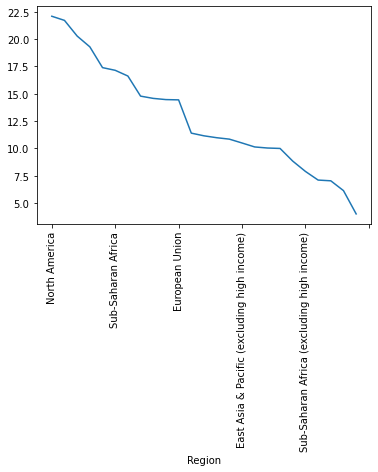

In [385]:
# d = df_1[df_1["Country Name"]=="France"]
# k = d[d["Indicator Code"]=="PRJ.POP.1519.3.MF"].dropna(axis=1)
# k = k.drop(columns=k.columns[-1])
# k = np.array(k.iloc[0,4:].values)
# n = simps(k, dx=5) 
# n
df_pays_score.sort_values(by="Score", ascending=False)
# print(n+"\n")
# df_pays_score
df_2 = pd.merge(df_pays_score, df_1.iloc[:,[0,2]] ,left_on="Country Name", right_on="Country Name", how="left")
df_2 = df_2.drop_duplicates()
df_2
# l = pd.to_numeric(df_2.groupby("Region")["Score"]).mean()
l= pd.to_numeric(df_2["Score"]).groupby(df_2["Region"])
l = l.mean()
l = l.sort_values(ascending=False)

l.plot()
plt.xticks(rotation=90)
print(l)
# data_country.iloc[0:5,[0,1,7]]

In [2]:
#Il faut créer une fonction pour récupérer la dernière valeur d'une ligne
def recup_last(d):
   return(d[d.last_valid_index()])

def AUC(d):
    k=d.dropna()
    return(simps(k, dx=5))

#il faut créer une fonction  pour scorer
#A decomposer

#valeurs peg à vérifier
def score_that_thing_please(d, l_pop, l_eqpmt):
    if d[d["Indicator Code"].isin(l_pop)]["AUC"].size > 0:
        P = d[d["Indicator Code"].isin(l_pop)]["AUC"].sum()
    else:
        P = 1
    if d[d["Indicator Code"].isin(l_eqpmt[1:3])]["last value"].size > 0:
        E_1 = d[d["Indicator Code"]==l_eqpmt[1]]["last value"].mean()
        E_2 = d[d["Indicator Code"]==l_eqpmt[2]]["last value"].mean()
        E = min(E_1, E_2)
#         E=E_2
    else:
        E = 1
    if d[d["Indicator Code"]==l_eqpmt[0]]["last value"].size > 0:
        G = d[d["Indicator Code"]==l_eqpmt[0]]["last value"].mean()
    else:
        G = 1
    if P*E*G in [-1, 0, 1]:
        return(1)
    else:
        print(np.log(P*E*G))
        return(np.log(P*E*G))

#Maintenant on va chercher les données pour scorer
l_int=['NY.GDP.PCAP.CD', 'IT.NET.USER.P2', 'IT.CMP.PCMP.P2']
l_15_19=["PRJ.POP.1519.2.MF", "PRJ.POP.1519.4.MF","PRJ.POP.1519.3.MF"]
l_20_24=["PRJ.POP.2024.2.MF", "PRJ.POP.2024.4.MF", "PRJ.POP.2024.3.MF"]
l_temp = l_15_19 + l_20_24

l_tot = l_int+ l_15_19+ l_20_24
# l_tot = l_15_19
print("1")
df_1 = pd.merge(data.iloc[:,0:2], data_country.iloc[:,[0,7]] ,left_on="Country Code", right_on="Country Code", how="left")
print("2")
df_1=df_1.join(data.iloc[:,2:])
print("3")
df_1["Region"] = df_1.apply(lambda x : country_to_region(x),axis=1)
df_1 = df_1.drop(columns=df_1.columns[-1])
df_1 = df_1.drop(columns="Indicator Name")
df_1 = df_1.drop(df_1[df_1["Country Name"]=="World"].index)

df_1 = df_1[df_1["Indicator Code"].isin(l_tot)]
df_1 = df_1[df_1.iloc[:,4:].notna().sum(axis=1)>0]


df_1["last value"] = df_1.apply(recup_last, axis=1)
df_1["AUC"] = df_1.iloc[:,4:-1].apply(AUC, axis=1)
# l = df_1[df_1["Country Name"]=="France"]

df_region_score = pd.DataFrame({'Region' : df_1["Region"].unique()})
df_region_score["Score"] = ""
for region in df_region_score["Region"].unique():
    print(region)
    df_region_score.loc[df_region_score[df_region_score["Region"]==region].index, "Score"] = score_that_thing_please(df_1[df_1["Region"]==region], l_temp, l_int)

# l[l["Indicator Code"].isin(l_temp)]
# score = {}
# score["France"] = score_that_thing_please(l, l_temp, l_int)
# df_1.iloc[0,:]

1
2
3
Arab World
10.849672262389717
East Asia & Pacific
29.243286013113146
East Asia & Pacific (excluding high income)
10.496827340564112
Euro area
14.4695608193788
Europe & Central Asia
29.713824112192693
Europe & Central Asia (excluding high income)
11.153175500441685
European Union
14.444179329546282
Heavily indebted poor countries (HIPC)
7.035577021006486
High income
14.786803882855253
Latin America & Caribbean
27.477643137264355
Latin America & Caribbean (excluding high income)
11.399617330881739
Least developed countries: UN classification
7.102774858048817
Low & middle income
9.997819816106617
Low income
6.13703387520871
Lower middle income
8.838059845264175
Middle East & North Africa
27.760400263147755
Middle East & North Africa (excluding high income)
10.03722344737302
Middle income
10.134195346094783
North America
30.567758811400406
OECD members
14.579535835029143
South Asia
26.138794478855242
Sub-Saharan Africa
25.43854973829862
Sub-Saharan Africa (excluding high income)
7.8

In [13]:
df_region_score.sort_values(by="Score", ascending=False)
# l = pd.to_numeric(df_2.groupby("Region")["Score"]).mean()

#utiliser moyenne d'outil masse salariale pour expliquer les différences de classement 

# df_region_score.plot()
# plt.xticks(rotation=90)
# print(l)

,Region,Score
18,North America,30.5678
4,Europe & Central Asia,29.7138
1,East Asia & Pacific,29.2433
15,Middle East & North Africa,27.7604
9,Latin America & Caribbean,27.4776
20,South Asia,26.1388
21,Sub-Saharan Africa,25.4385
8,High income,14.7868
19,OECD members,14.5795
3,Euro area,14.4696


1
2
3


Median  \
Region                                             Indicator Code                    
Arab World                                         IT.CMP.PCMP.P2         1.887733   
                                                   IT.NET.USER.P2         5.326347   
                                                   NY.GDP.PCAP.CD      2012.684507   
East Asia & Pacific                                IT.CMP.PCMP.P2         7.730277   
                                                   IT.NET.USER.P2        18.664916   
                                                   NY.GDP.PCAP.CD      7085.795009   
                                                   PRJ.POP.1519.2.MF   1231.861304   
                                                   PRJ.POP.1519.3.MF   2401.931739   
                                                   PRJ.POP.1519.4.MF    319.115652   
                                                   PRJ.POP.2024.2.MF    524.285217   
                                                   PRJ.POP.2024.3.MF   1949.852174   
                                                   PRJ.POP.2024.4.MF   1684.354348   
East Asia & Pacific (excluding high income)        IT.CMP.PCMP.P2         0.739406   
                                                   IT.NET.USER.P2         6.885265   
                                                   NY.GDP.PCAP.CD       535.833629   
Euro area                                          IT.CMP.PCMP.P2        17.099643   
                                                   IT.NET.USER.P2        42.096423   
                                                   NY.GDP.PCAP.CD     20190.188991   
Europe & Central Asia                              IT.CMP.PCMP.P2        14.829988   
                                                   IT.NET.USER.P2        36.577026   
                                                   NY.GDP.PCAP.CD     16427.814228   
                                                   PRJ.POP.1519.2.MF    448.863830   
                                                   PRJ.POP.1519.3.MF    413.564255   
                                                   PRJ.POP.1519.4.MF      9.068936   
                                                   PRJ.POP.2024.2.MF     72.525532   
                                                   PRJ.POP.2024.3.MF    644.797872   
                                                   PRJ.POP.2024.4.MF    251.661915   
Europe & Central Asia (excluding high income)      IT.CMP.PCMP.P2         2.786773   
                                                   IT.NET.USER.P2        10.976177   
                                                   NY.GDP.PCAP.CD      2538.288554   
European Union                                     IT.CMP.PCMP.P2        15.898310   
                                                   IT.NET.USER.P2        30.219523   
                                                   NY.GDP.PCAP.CD     16274.370887   
Gibraltar                                          IT.CMP.PCMP.P2        16.541486   
                                                   IT.NET.USER.P2        35.978107   
Heavily indebted poor countries (HIPC)             IT.CMP.PCMP.P2         0.422836   
                                                   IT.NET.USER.P2         1.385671   
                                                   NY.GDP.PCAP.CD       353.548682   
High income                                        IT.CMP.PCMP.P2        23.639951   
                                                   IT.NET.USER.P2        49.933772   
                                                   NY.GDP.PCAP.CD     21285.125100   
Latin America & Caribbean                          IT.CMP.PCMP.P2         5.876821   
                                                   IT.NET.USER.P2        17.203202   
                                                   NY.GDP.PCAP.CD      5369.979590   
                                                   PRJ.POP.1519.2.MF    783.176000   
                                  

Dans la région North America l'indicateur IT.CMP.PCMP.P2 a pour valeur médiane 27.36.
Mais aussi un ecart-type de 20.58.
Son skewness 0.55 indique que la distribution est plutôt étalée à droite.
Enfin son kurtosis 0.11 indique que la distribution a le même aplatissement que la distribution normale.

En voici une petite boîte à moustache:



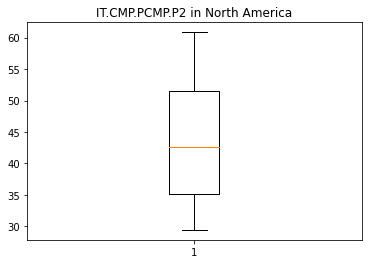

In [57]:
# df_1.iloc[:,4:].T.describe().T

    
    
petit_resume_svp(df_2, "North America", "IT.CMP.PCMP.P2", df_1)
    
    
    

In [44]:
# d = df_1[df_1["Region"]=="North America"]
# d= d[d["Indicator Code"]=="IT.CMP.PCMP.P2"]
# d.iloc[:,4:68].dropna(axis=1).mean(axis=0)
# .dropna().mean(axis=0, skipna=True)
# d.iloc[:,4:].T.boxplot()
d_boxplot.column

NameError: name 'd_boxplot' is not defined